In [1]:
import sys
import os
import itertools
import pandas as pd
current_dir = os.getcwd()
print(current_dir)

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all


In [2]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['../../../../UCB-USACE-LSTMs', '/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all', '/Users/canruso/Desktop', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python310.zip', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/lib-dynload', '', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages/setuptools/_vendor']


In [3]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot

In [4]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

target_path = os.path.join(library_path, 'UCB_training', 'models', 'calpella_all')

if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("calpella")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all
Train Basin File Exists: True


In [9]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("calpella_gage_nlayer.yaml")
path_to_physics_data = Path(library_path + "/russian_river_data/Calpella_daily.csv")

In [10]:
features_with_physics = [
    #from hourly
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "POTTER VALLEY CA FLOW USGS_ADJUSTED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    #from new capella.csv
    'Capella Gage FLOW',
    'EF Russian 20 ET-POTENTIAL',
    'EF Russian 20 FLOW',
    'EF Russian 20 FLOW-BASE',
    'EF Russian 20 INFILTRATION',
    'EF Russian 20 PERC-SOIL',
    'EF Russian 20 SATURATION FRACTION',
    #    'Lake Mendocino Storage',
]

In [11]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "seq_length": [90, 180],
    "num_layers": [1, 2],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
no_physics_results = []
physics_results = []

NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:40:02,770: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234002/output.log initialized.
2025-02-12 23:40:02,771: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234002
2025-02-12 23:40:02,771: ### Run configurations for testing_run
2025-02-12 23:40:02,772: experiment_name: testing_run
2025-02-12 23:40:02,772: train_basin_file: calpella
2025-02-12 23:40:02,772: validation_basin_file: calpella
2025-02-12 23:40:02,772: test_basin_file: calpella
2025-02-12 23:40:02,773: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:40:02,773: train_end_date: 2002-09-30 00:00:00
2025-02-12 23:40:02,773: validation_start_date: 2002-10-01 00:00:00
2025-02-12 23:40:02,774: validation_end_date: 2005-09-30 00:00:00
2025-02-12 23:40

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]
2025-02-12 23:40:18,297: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234002/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:40:18,298: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234002/validation/model_epoch016/validation_results.p
got predictions


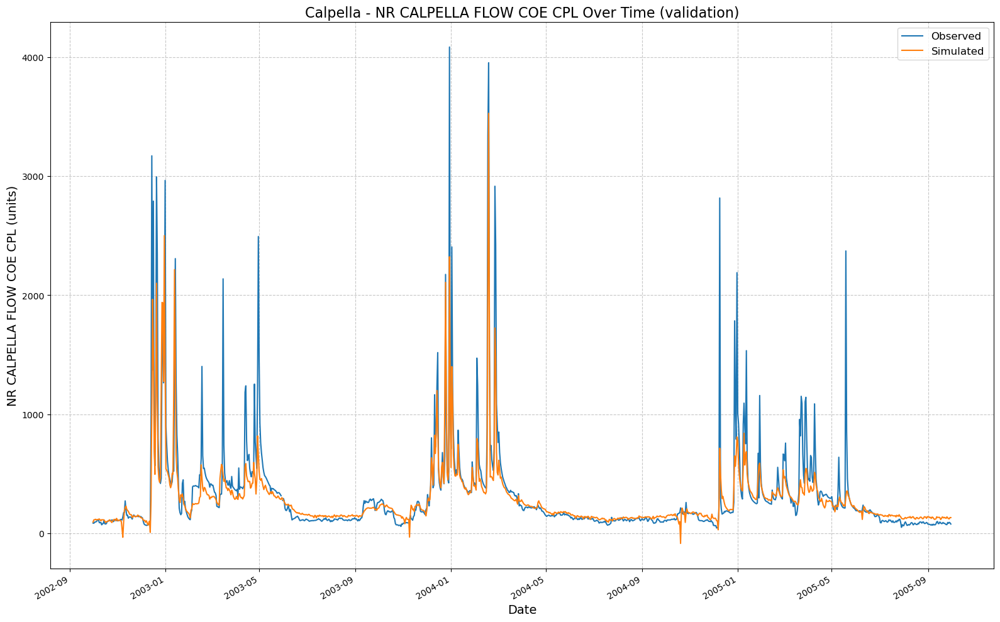

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234002/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:40:18,545: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234018/output.log initialized.
2025-02-12 23:40:18,545: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234018
2025-02-12 23:40:18,546: ### Run configurations for testing_run
2025-02-12 23:40:18,546: experiment_name: testing_run
2025-02-12 23:40:18,546: train_basin_file: calpella
2025-02-12 23:40:18,547: validation_basin_file: calpella
2025-02-12 23:40:18,547: test_basin_file: calpella
2025-02-12 23:40:18,547: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:40:18,547: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.14it/s]
2025-02-12 23:40:18,671: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1301.77it/s]
2025-02-12 23:40:18,675: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 14.26it/s, Loss: 0.0000]
2025-02-12 23:40:19,593: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.91it/s, Loss: 0.0000]
2025-02-12 23:40:20,334: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 15.24it/s, Loss: 0.0000]
2025-02-12 23:40:21,058: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 14.95it/s, Loss: 0.0000]
2025-02-12 23:40:21,796: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 14.75it/s, Loss: 0.0000]
2025-02-12 23:40:22,544: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]
2025-02-12 23:40:44,869: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234018/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:40:44,870: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234018/validation/model_epoch032/validation_results.p
got predictions


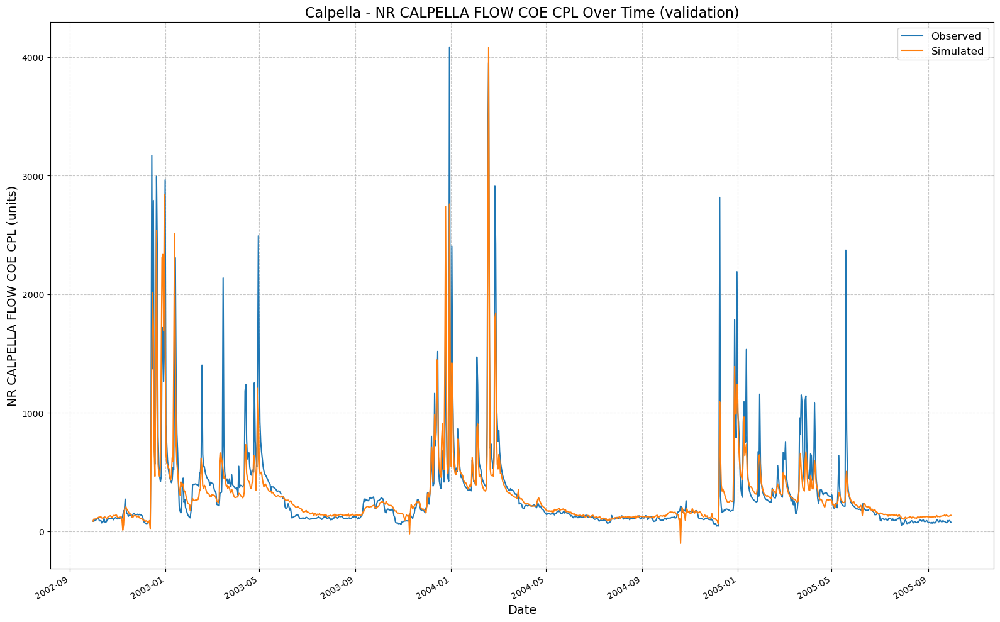

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234018/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:40:45,102: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234045/output.log initialized.
2025-02-12 23:40:45,102: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234045
2025-02-12 23:40:45,102: ### Run configurations for testing_run
2025-02-12 23:40:45,103: experiment_name: testing_run
2025-02-12 23:40:45,103: train_basin_file: calpella
2025-02-12 23:40:45,103: validation_basin_file: calpella
2025-02-12 23:40:45,104: test_basin_file: calpella
2025-02-12 23:40:45,104: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:40:45,104: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.36it/s]
2025-02-12 23:40:45,210: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1305.42it/s]
2025-02-12 23:40:45,214: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 15.44it/s, Loss: 0.0000]
2025-02-12 23:40:46,055: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.56it/s, Loss: 0.0000]
2025-02-12 23:40:46,813: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 14.69it/s, Loss: 0.0000]
2025-02-12 23:40:47,563: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 14.84it/s, Loss: 0.0000]
2025-02-12 23:40:48,306: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 15.06it/s, Loss: 0.0000]
2025-02-12 23:40:49,040: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]
2025-02-12 23:40:58,804: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234045/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:40:58,805: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234045/validation/model_epoch016/validation_results.p
got predictions


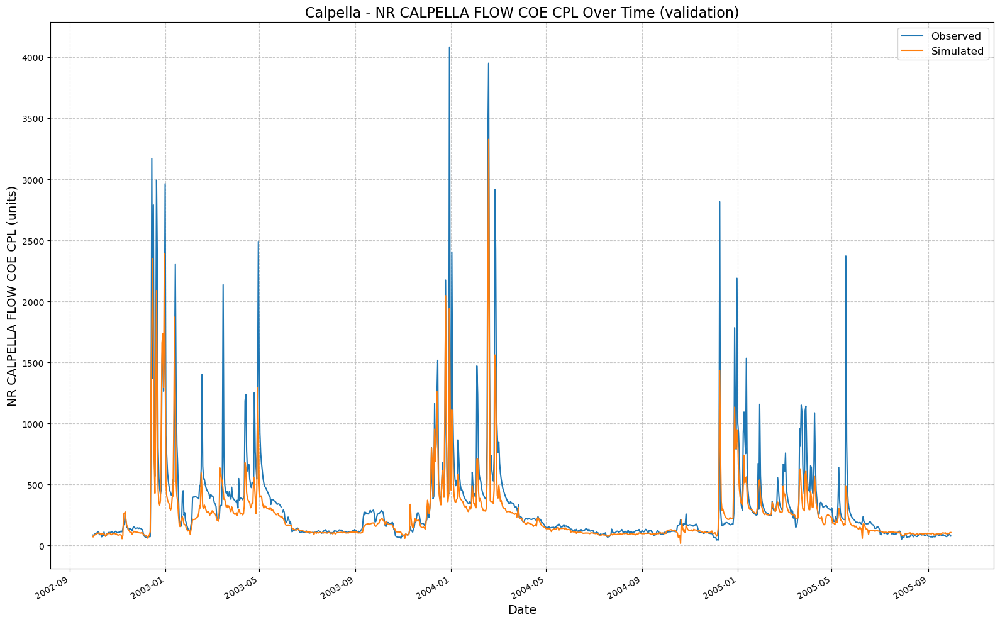

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234045/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:40:59,049: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234059/output.log initialized.
2025-02-12 23:40:59,049: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234059
2025-02-12 23:40:59,050: ### Run configurations for testing_run
2025-02-12 23:40:59,050: experiment_name: testing_run
2025-02-12 23:40:59,050: train_basin_file: calpella
2025-02-12 23:40:59,051: validation_basin_file: calpella
2025-02-12 23:40:59,051: test_basin_file: calpella
2025-02-12 23:40:59,051: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:40:59,051: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.79it/s]
2025-02-12 23:40:59,161: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1244.23it/s]
2025-02-12 23:40:59,165: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.73it/s, Loss: 0.0000]
2025-02-12 23:41:00,080: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.41it/s, Loss: 0.0000]
2025-02-12 23:41:00,846: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 15.48it/s, Loss: 0.0000]
2025-02-12 23:41:01,559: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 14.88it/s, Loss: 0.0000]
2025-02-12 23:41:02,301: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 14.44it/s, Loss: 0.0000]
2025-02-12 23:41:03,067: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]
2025-02-12 23:41:25,957: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234059/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:41:25,958: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234059/validation/model_epoch032/validation_results.p
got predictions


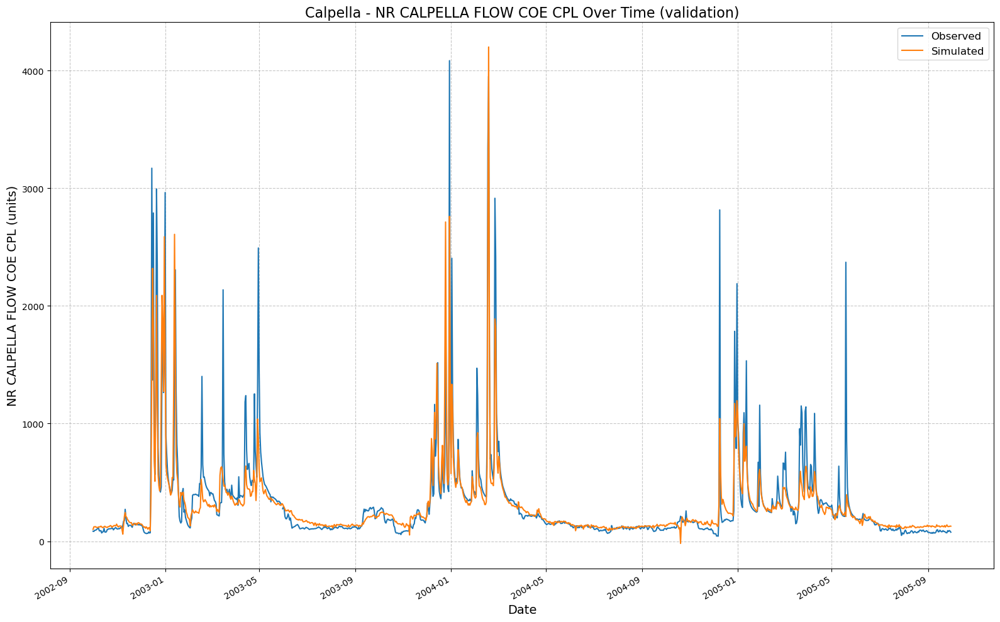

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234059/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:41:26,199: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234126/output.log initialized.
2025-02-12 23:41:26,199: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234126
2025-02-12 23:41:26,200: ### Run configurations for testing_run
2025-02-12 23:41:26,200: experiment_name: testing_run
2025-02-12 23:41:26,200: train_basin_file: calpella
2025-02-12 23:41:26,200: validation_basin_file: calpella
2025-02-12 23:41:26,201: test_basin_file: calpella
2025-02-12 23:41:26,201: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:41:26,201: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.29it/s]
2025-02-12 23:41:26,317: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1131.15it/s]
2025-02-12 23:41:26,321: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.49it/s, Loss: 0.0000]
2025-02-12 23:41:27,923: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.07it/s, Loss: 0.0000]
2025-02-12 23:41:29,290: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.44it/s, Loss: 0.0000]
2025-02-12 23:41:30,771: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.65it/s, Loss: 0.0000]
2025-02-12 23:41:32,211: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.73it/s, Loss: 0.0000]
2025-02-12 23:41:33,638: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]
2025-02-12 23:41:51,628: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234126/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:41:51,630: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234126/validation/model_epoch016/validation_results.p
got predictions


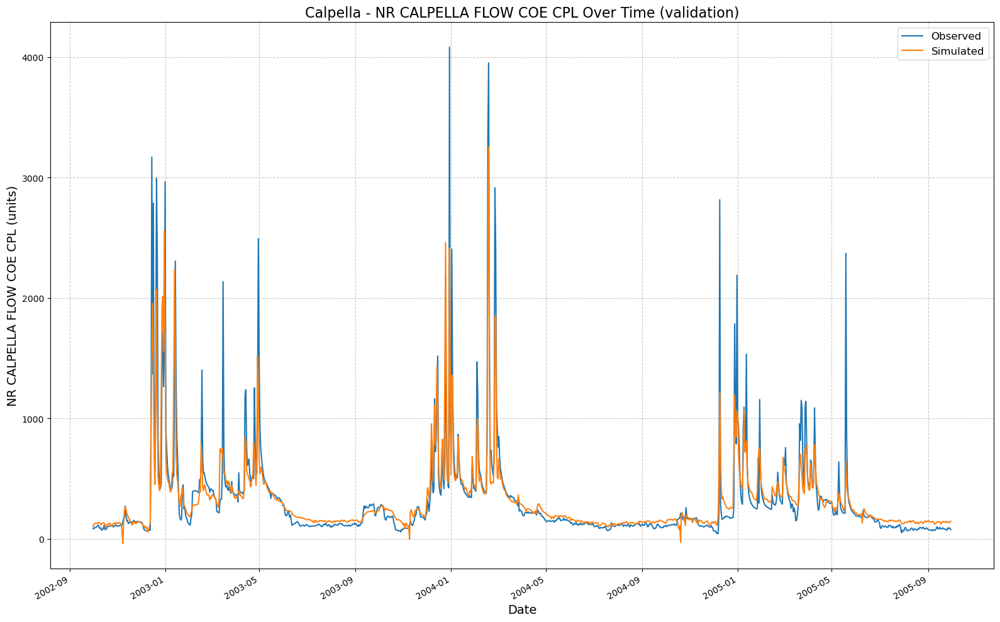

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234126/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:41:51,867: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234151/output.log initialized.
2025-02-12 23:41:51,867: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234151
2025-02-12 23:41:51,868: ### Run configurations for testing_run
2025-02-12 23:41:51,868: experiment_name: testing_run
2025-02-12 23:41:51,868: train_basin_file: calpella
2025-02-12 23:41:51,869: validation_basin_file: calpella
2025-02-12 23:41:51,869: test_basin_file: calpella
2025-02-12 23:41:51,869: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:41:51,870: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.87it/s]
2025-02-12 23:41:51,988: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1339.18it/s]
2025-02-12 23:41:51,992: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.24it/s, Loss: 0.0000]
2025-02-12 23:41:53,442: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.22it/s, Loss: 0.0000]
2025-02-12 23:41:54,969: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.63it/s, Loss: 0.0000]
2025-02-12 23:41:56,247: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.69it/s, Loss: 0.0000]
2025-02-12 23:41:57,680: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.97it/s, Loss: 0.0000]
2025-02-12 23:41:59,064: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]
2025-02-12 23:42:40,101: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234151/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:42:40,103: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234151/validation/model_epoch032/validation_results.p
got predictions


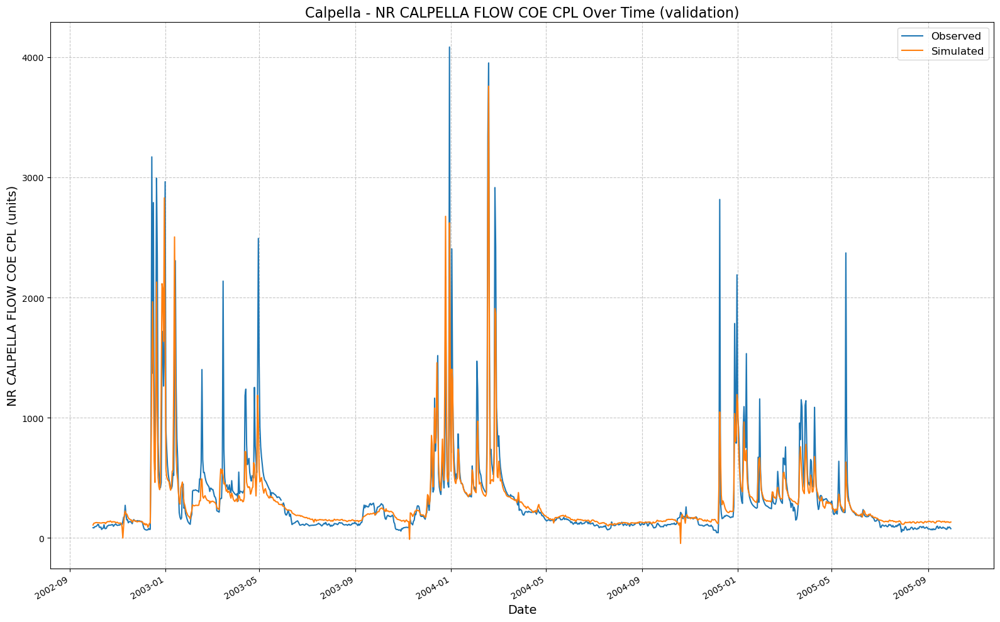

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234151/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:42:40,565: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234240/output.log initialized.
2025-02-12 23:42:40,566: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234240
2025-02-12 23:42:40,567: ### Run configurations for testing_run
2025-02-12 23:42:40,567: experiment_name: testing_run
2025-02-12 23:42:40,568: train_basin_file: calpella
2025-02-12 23:42:40,568: validation_basin_file: calpella
2025-02-12 23:42:40,569: test_basin_file: calpella
2025-02-12 23:42:40,569: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:42:40,569: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.46it/s]
2025-02-12 23:42:40,688: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1236.16it/s]
2025-02-12 23:42:40,692: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.77it/s, Loss: 0.0000]
2025-02-12 23:42:42,254: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.98it/s, Loss: 0.0000]
2025-02-12 23:42:43,636: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.78it/s, Loss: 0.0000]
2025-02-12 23:42:45,052: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.38it/s, Loss: 0.0000]
2025-02-12 23:42:46,547: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-12 23:42:47,912: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]
2025-02-12 23:43:05,166: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234240/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:43:05,167: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234240/validation/model_epoch016/validation_results.p
got predictions


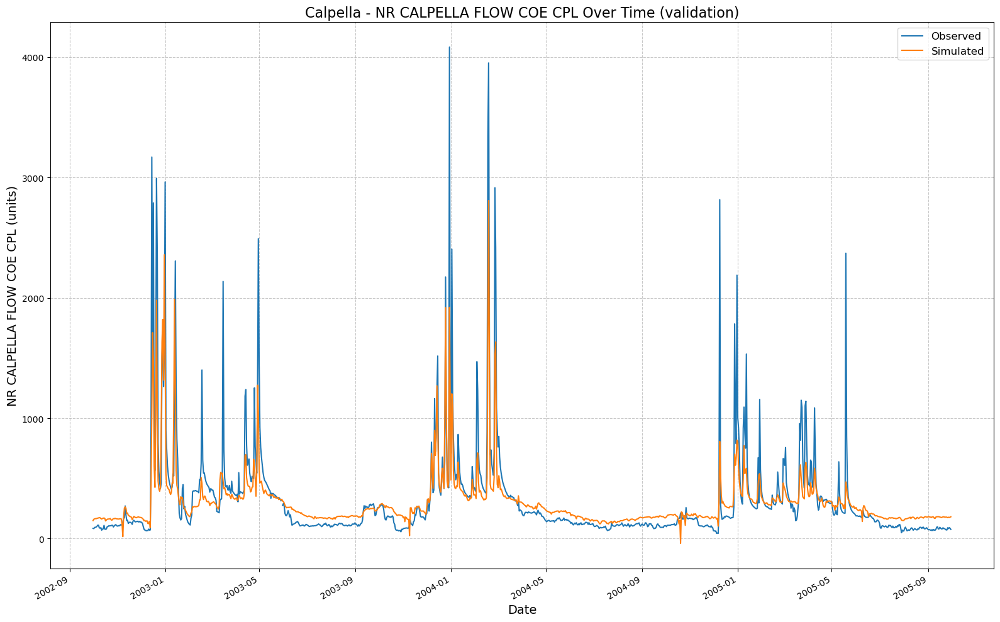

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234240/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:43:05,418: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234305/output.log initialized.
2025-02-12 23:43:05,419: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234305
2025-02-12 23:43:05,419: ### Run configurations for testing_run
2025-02-12 23:43:05,420: experiment_name: testing_run
2025-02-12 23:43:05,421: train_basin_file: calpella
2025-02-12 23:43:05,421: validation_basin_file: calpella
2025-02-12 23:43:05,422: test_basin_file: calpella
2025-02-12 23:43:05,422: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:43:05,423: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.75it/s]
2025-02-12 23:43:05,555: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1197.35it/s]
2025-02-12 23:43:05,559: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.92it/s, Loss: 0.0000]
2025-02-12 23:43:07,070: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.80it/s, Loss: 0.0000]
2025-02-12 23:43:08,482: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.01it/s, Loss: 0.0000]
2025-02-12 23:43:09,858: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.16it/s, Loss: 0.0000]
2025-02-12 23:43:11,399: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.15it/s, Loss: 0.0000]
2025-02-12 23:43:12,752: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]
2025-02-12 23:43:52,698: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234305/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:43:52,699: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234305/validation/model_epoch032/validation_results.p
got predictions


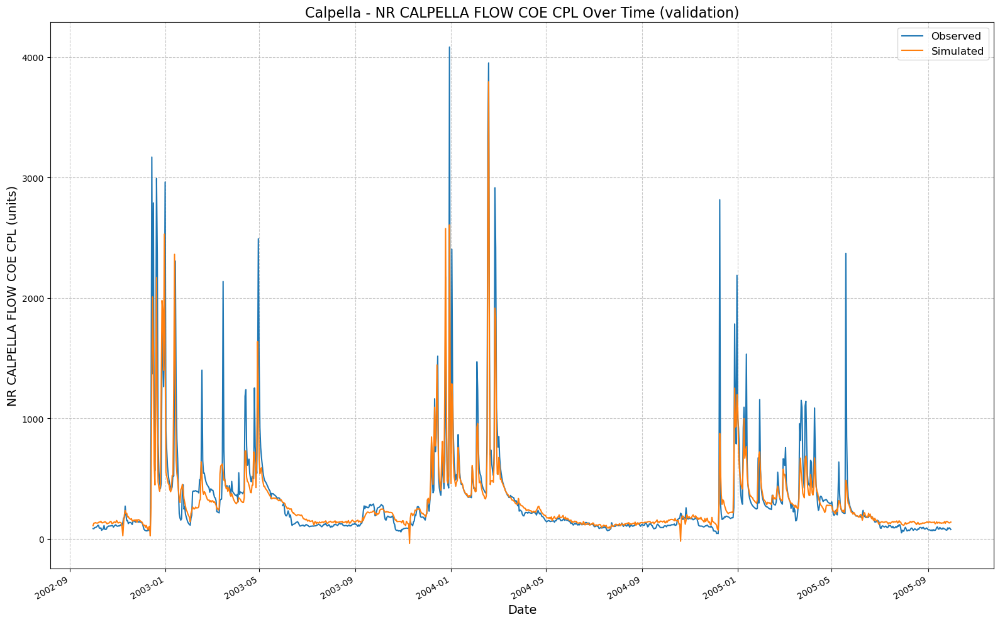

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234305/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:43:52,952: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234352/output.log initialized.
2025-02-12 23:43:52,953: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234352
2025-02-12 23:43:52,953: ### Run configurations for testing_run
2025-02-12 23:43:52,953: experiment_name: testing_run
2025-02-12 23:43:52,954: train_basin_file: calpella
2025-02-12 23:43:52,954: validation_basin_file: calpella
2025-02-12 23:43:52,955: test_basin_file: calpella
2025-02-12 23:43:52,955: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:43:52,956: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.20it/s]
2025-02-12 23:43:53,083: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 697.31it/s]
2025-02-12 23:43:53,090: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.52it/s, Loss: 0.0000]
2025-02-12 23:43:54,497: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.45it/s, Loss: 0.0000]
2025-02-12 23:43:55,665: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.95it/s, Loss: 0.0000]
2025-02-12 23:43:56,896: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.34it/s, Loss: 0.0000]
2025-02-12 23:43:58,077: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.24it/s, Loss: 0.0000]
2025-02-12 23:43:59,270: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]
2025-02-12 23:44:14,966: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234352/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:44:14,967: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234352/validation/model_epoch016/validation_results.p
got predictions


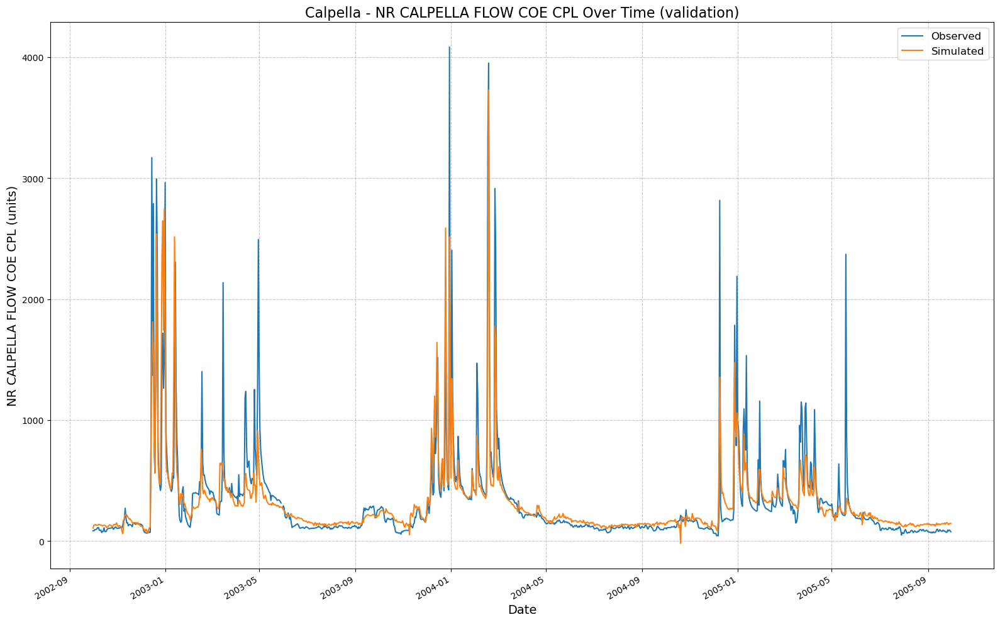

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234352/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:44:15,201: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234415/output.log initialized.
2025-02-12 23:44:15,201: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234415
2025-02-12 23:44:15,202: ### Run configurations for testing_run
2025-02-12 23:44:15,202: experiment_name: testing_run
2025-02-12 23:44:15,202: train_basin_file: calpella
2025-02-12 23:44:15,203: validation_basin_file: calpella
2025-02-12 23:44:15,203: test_basin_file: calpella
2025-02-12 23:44:15,203: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:44:15,203: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.27it/s]
2025-02-12 23:44:15,308: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1380.61it/s]
2025-02-12 23:44:15,312: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.03it/s, Loss: 0.0000]
2025-02-12 23:44:16,650: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.84it/s, Loss: 0.0000]
2025-02-12 23:44:17,897: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.30it/s, Loss: 0.0000]
2025-02-12 23:44:19,082: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.60it/s, Loss: 0.0000]
2025-02-12 23:44:20,230: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.17it/s, Loss: 0.0000]
2025-02-12 23:44:21,431: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]
2025-02-12 23:44:55,177: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234415/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:44:55,178: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234415/validation/model_epoch032/validation_results.p
got predictions


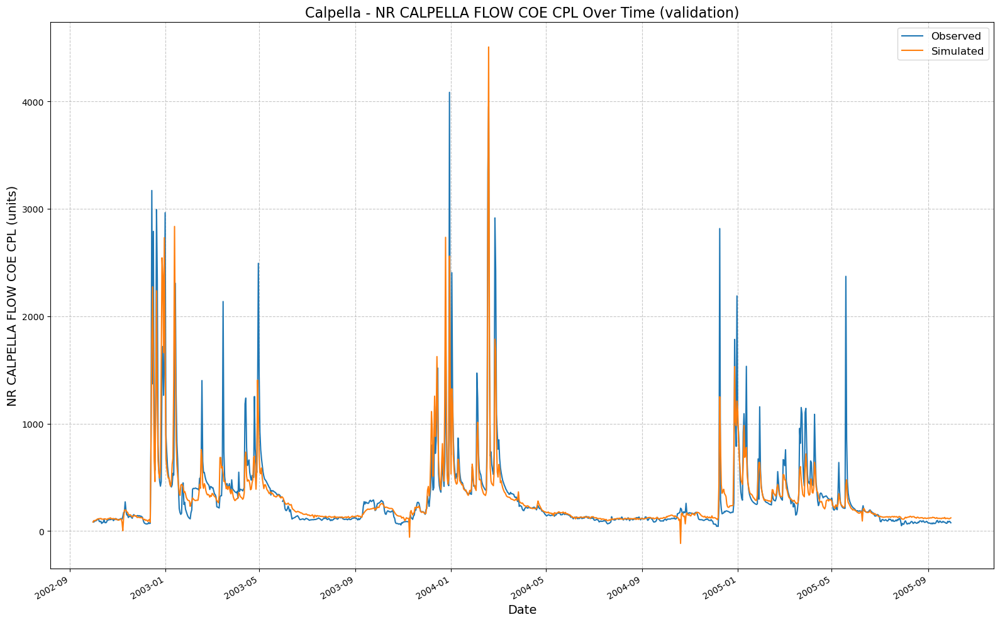

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234415/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:44:55,445: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234455/output.log initialized.
2025-02-12 23:44:55,445: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234455
2025-02-12 23:44:55,446: ### Run configurations for testing_run
2025-02-12 23:44:55,447: experiment_name: testing_run
2025-02-12 23:44:55,447: train_basin_file: calpella
2025-02-12 23:44:55,448: validation_basin_file: calpella
2025-02-12 23:44:55,448: test_basin_file: calpella
2025-02-12 23:44:55,448: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:44:55,449: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.72it/s]
2025-02-12 23:44:55,579: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1443.33it/s]
2025-02-12 23:44:55,585: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.33it/s, Loss: 0.0000]
2025-02-12 23:44:56,946: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.00it/s, Loss: 0.0000]
2025-02-12 23:44:58,170: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.14it/s, Loss: 0.0000]
2025-02-12 23:44:59,377: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.30it/s, Loss: 0.0000]
2025-02-12 23:45:00,562: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.88it/s, Loss: 0.0000]
2025-02-12 23:45:01,803: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]
2025-02-12 23:45:16,362: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234455/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:45:16,363: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234455/validation/model_epoch016/validation_results.p
got predictions


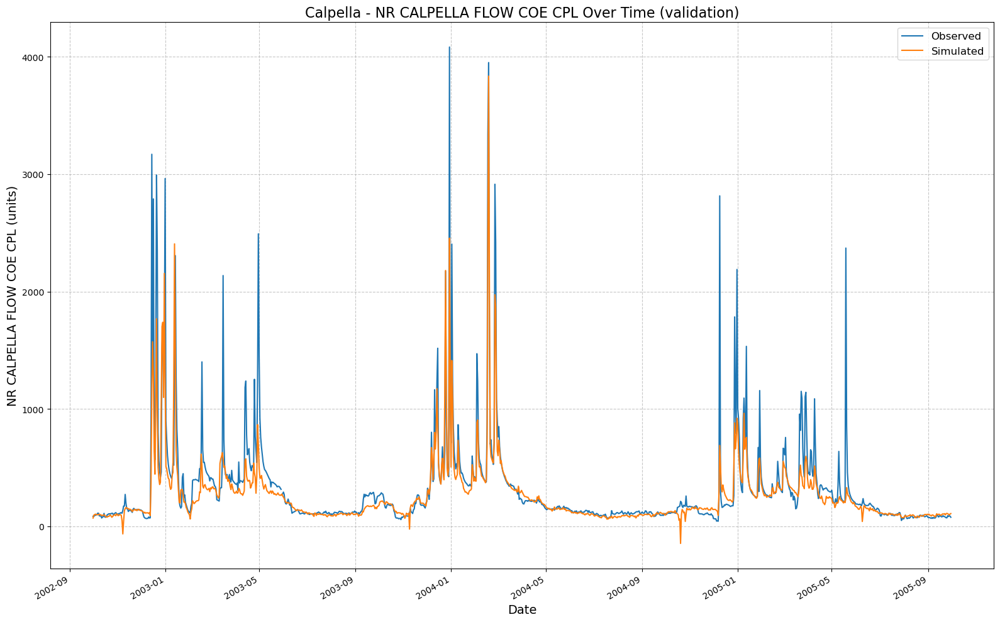

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234455/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:45:16,591: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234516/output.log initialized.
2025-02-12 23:45:16,591: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234516
2025-02-12 23:45:16,592: ### Run configurations for testing_run
2025-02-12 23:45:16,592: experiment_name: testing_run
2025-02-12 23:45:16,593: train_basin_file: calpella
2025-02-12 23:45:16,593: validation_basin_file: calpella
2025-02-12 23:45:16,594: test_basin_file: calpella
2025-02-12 23:45:16,594: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:45:16,594: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.35it/s]
2025-02-12 23:45:16,699: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1496.90it/s]
2025-02-12 23:45:16,702: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.62it/s, Loss: 0.0000]
2025-02-12 23:45:17,971: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.55it/s, Loss: 0.0000]
2025-02-12 23:45:19,126: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.42it/s, Loss: 0.0000]
2025-02-12 23:45:20,296: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.58it/s, Loss: 0.0000]
2025-02-12 23:45:21,446: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.33it/s, Loss: 0.0000]
2025-02-12 23:45:22,628: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]
2025-02-12 23:45:57,621: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234516/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:45:57,622: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234516/validation/model_epoch032/validation_results.p
got predictions


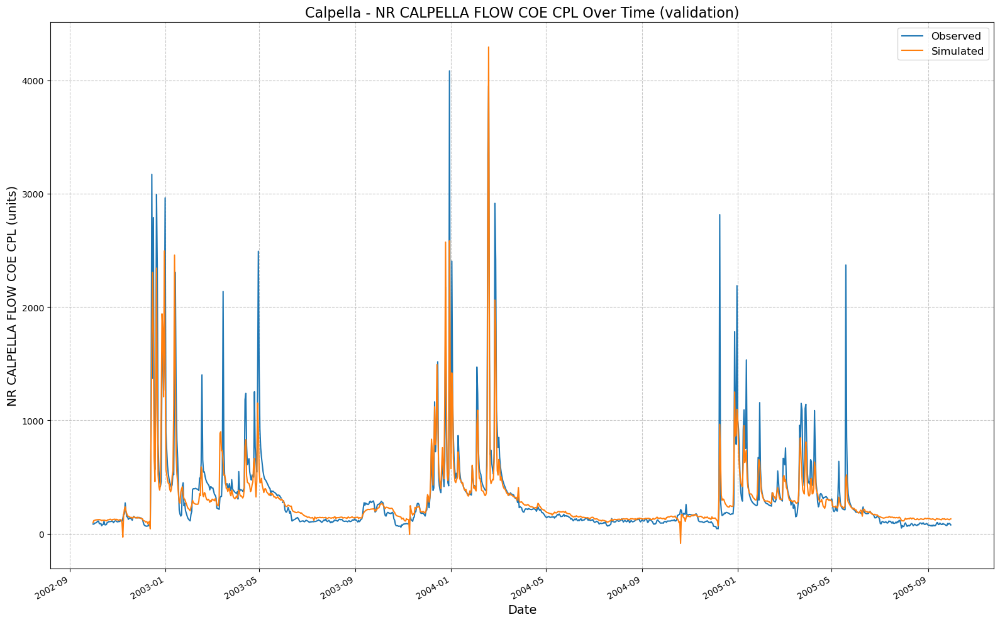

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234516/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:45:57,855: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234557/output.log initialized.
2025-02-12 23:45:57,856: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234557
2025-02-12 23:45:57,856: ### Run configurations for testing_run
2025-02-12 23:45:57,856: experiment_name: testing_run
2025-02-12 23:45:57,857: train_basin_file: calpella
2025-02-12 23:45:57,857: validation_basin_file: calpella
2025-02-12 23:45:57,858: test_basin_file: calpella
2025-02-12 23:45:57,858: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:45:57,858: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.67it/s]
2025-02-12 23:45:57,981: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1242.02it/s]
2025-02-12 23:45:57,985: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s, Loss: 0.0000]
2025-02-12 23:46:00,670: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.61it/s, Loss: 0.0000]
2025-02-12 23:46:03,060: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-12 23:46:05,360: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.83it/s, Loss: 0.0000]
2025-02-12 23:46:07,638: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.90it/s, Loss: 0.0000]
2025-02-12 23:46:09,888: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]
2025-02-12 23:46:37,527: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234557/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:46:37,528: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234557/validation/model_epoch016/validation_results.p
got predictions


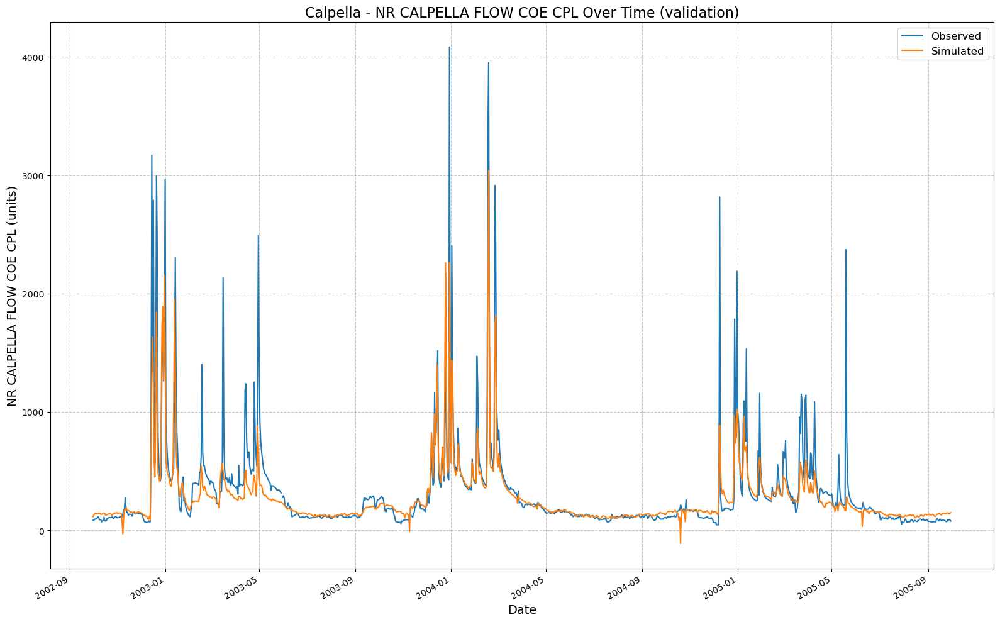

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234557/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:46:37,759: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234637/output.log initialized.
2025-02-12 23:46:37,760: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234637
2025-02-12 23:46:37,760: ### Run configurations for testing_run
2025-02-12 23:46:37,761: experiment_name: testing_run
2025-02-12 23:46:37,761: train_basin_file: calpella
2025-02-12 23:46:37,762: validation_basin_file: calpella
2025-02-12 23:46:37,762: test_basin_file: calpella
2025-02-12 23:46:37,763: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:46:37,763: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  8.57it/s]
2025-02-12 23:46:37,897: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1248.68it/s]
2025-02-12 23:46:37,901: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.05it/s, Loss: 0.0000]
2025-02-12 23:46:40,777: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.83it/s, Loss: 0.0000]
2025-02-12 23:46:43,056: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.89it/s, Loss: 0.0000]
2025-02-12 23:46:45,307: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.49it/s, Loss: 0.0000]
2025-02-12 23:46:47,761: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.54it/s, Loss: 0.0000]
2025-02-12 23:46:50,189: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]
2025-02-12 23:47:58,232: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234637/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:47:58,233: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234637/validation/model_epoch032/validation_results.p
got predictions


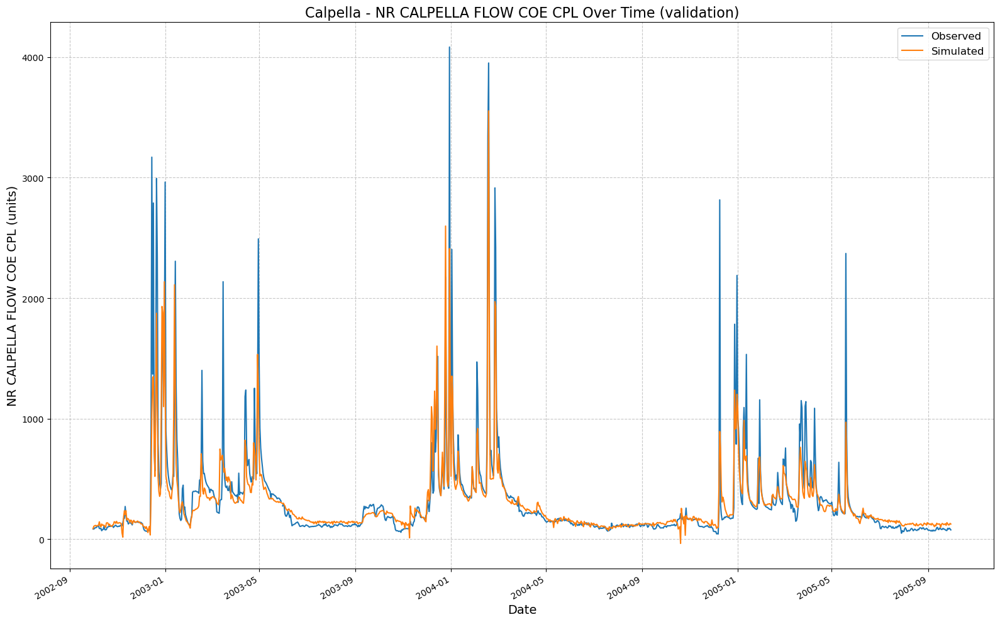

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234637/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:47:58,501: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234758/output.log initialized.
2025-02-12 23:47:58,502: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234758
2025-02-12 23:47:58,502: ### Run configurations for testing_run
2025-02-12 23:47:58,502: experiment_name: testing_run
2025-02-12 23:47:58,502: train_basin_file: calpella
2025-02-12 23:47:58,503: validation_basin_file: calpella
2025-02-12 23:47:58,503: test_basin_file: calpella
2025-02-12 23:47:58,503: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:47:58,504: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.82it/s]
2025-02-12 23:47:58,614: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1288.97it/s]
2025-02-12 23:47:58,617: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.28it/s, Loss: 0.0000]
2025-02-12 23:48:01,321: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.13it/s, Loss: 0.0000]
2025-02-12 23:48:03,987: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.78it/s, Loss: 0.0000]
2025-02-12 23:48:06,293: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.47it/s, Loss: 0.0000]
2025-02-12 23:48:08,756: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.49it/s, Loss: 0.0000]
2025-02-12 23:48:11,210: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]
2025-02-12 23:48:39,440: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234758/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:48:39,441: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234758/validation/model_epoch016/validation_results.p
got predictions


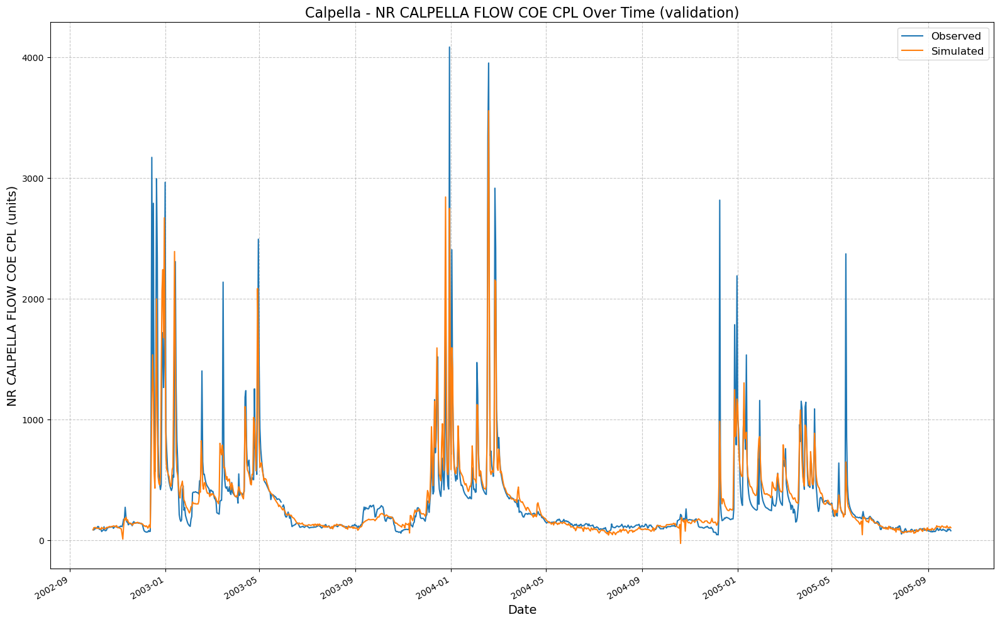

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234758/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:48:39,672: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234839/output.log initialized.
2025-02-12 23:48:39,673: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234839
2025-02-12 23:48:39,673: ### Run configurations for testing_run
2025-02-12 23:48:39,674: experiment_name: testing_run
2025-02-12 23:48:39,674: train_basin_file: calpella
2025-02-12 23:48:39,674: validation_basin_file: calpella
2025-02-12 23:48:39,675: test_basin_file: calpella
2025-02-12 23:48:39,675: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:48:39,676: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.85it/s]
2025-02-12 23:48:39,786: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1155.77it/s]
2025-02-12 23:48:39,791: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.73it/s, Loss: 0.0000]
2025-02-12 23:48:42,251: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.75it/s, Loss: 0.0000]
2025-02-12 23:48:44,568: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-12 23:48:46,831: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.85it/s, Loss: 0.0000]
2025-02-12 23:48:49,102: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.86it/s, Loss: 0.0000]
2025-02-12 23:48:51,367: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]
2025-02-12 23:49:59,393: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234839/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:49:59,394: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234839/validation/model_epoch032/validation_results.p
got predictions


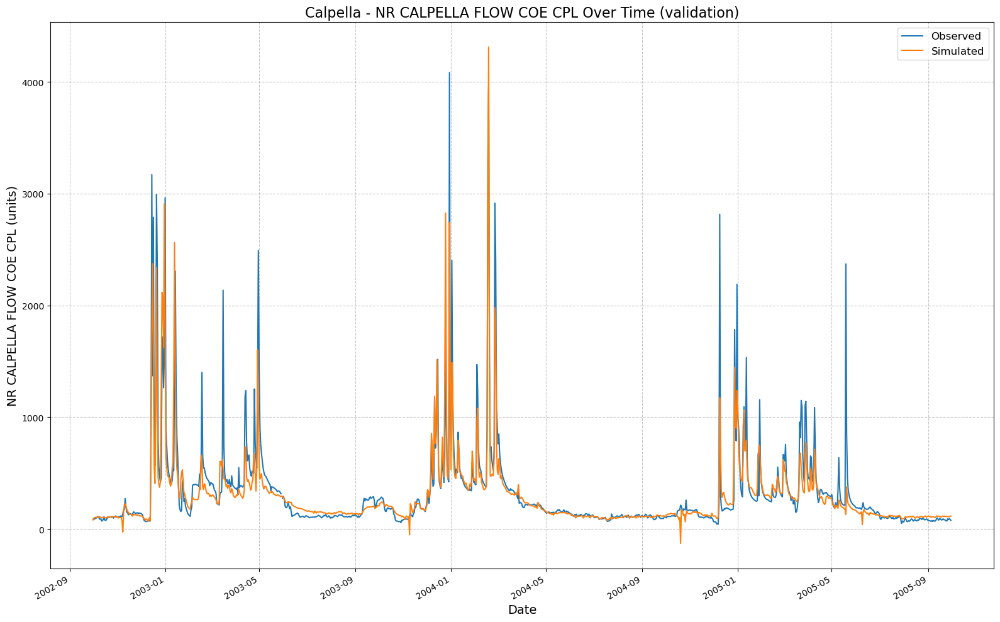

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234839/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:49:59,624: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234959/output.log initialized.
2025-02-12 23:49:59,624: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234959
2025-02-12 23:49:59,625: ### Run configurations for testing_run
2025-02-12 23:49:59,625: experiment_name: testing_run
2025-02-12 23:49:59,626: train_basin_file: calpella
2025-02-12 23:49:59,626: validation_basin_file: calpella
2025-02-12 23:49:59,626: test_basin_file: calpella
2025-02-12 23:49:59,627: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:49:59,627: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.45it/s]
2025-02-12 23:49:59,742: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1633.93it/s]
2025-02-12 23:49:59,746: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.62it/s, Loss: 0.0000]
2025-02-12 23:50:02,251: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  5.08it/s, Loss: 0.0000]
2025-02-12 23:50:04,420: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-12 23:50:06,680: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  5.01it/s, Loss: 0.0000]
2025-02-12 23:50:08,877: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.96it/s, Loss: 0.0000]
2025-02-12 23:50:11,098: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]
2025-02-12 23:50:38,068: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234959/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:50:38,069: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234959/validation/model_epoch016/validation_results.p
got predictions


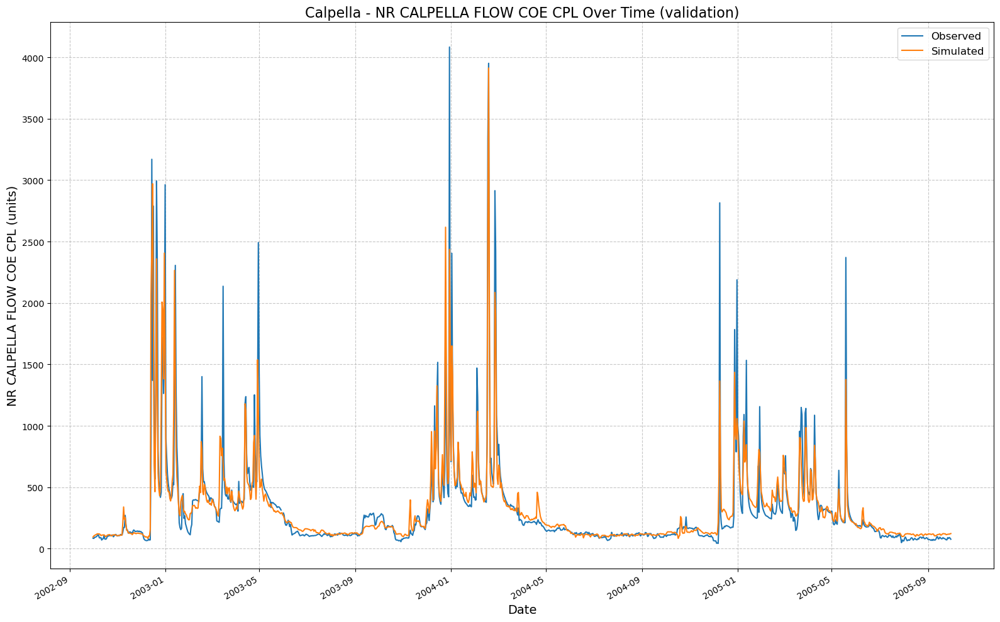

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_234959/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:50:38,309: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235038/output.log initialized.
2025-02-12 23:50:38,309: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235038
2025-02-12 23:50:38,309: ### Run configurations for testing_run
2025-02-12 23:50:38,309: experiment_name: testing_run
2025-02-12 23:50:38,310: train_basin_file: calpella
2025-02-12 23:50:38,310: validation_basin_file: calpella
2025-02-12 23:50:38,310: test_basin_file: calpella
2025-02-12 23:50:38,311: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:50:38,311: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.32it/s]
2025-02-12 23:50:38,416: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1506.03it/s]
2025-02-12 23:50:38,420: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.39it/s, Loss: 0.0000]
2025-02-12 23:50:41,059: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.95it/s, Loss: 0.0000]
2025-02-12 23:50:43,283: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  5.03it/s, Loss: 0.0000]
2025-02-12 23:50:45,471: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.94it/s, Loss: 0.0000]
2025-02-12 23:50:47,699: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.88it/s, Loss: 0.0000]
2025-02-12 23:50:49,955: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]
2025-02-12 23:51:58,339: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235038/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:51:58,340: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235038/validation/model_epoch032/validation_results.p
got predictions


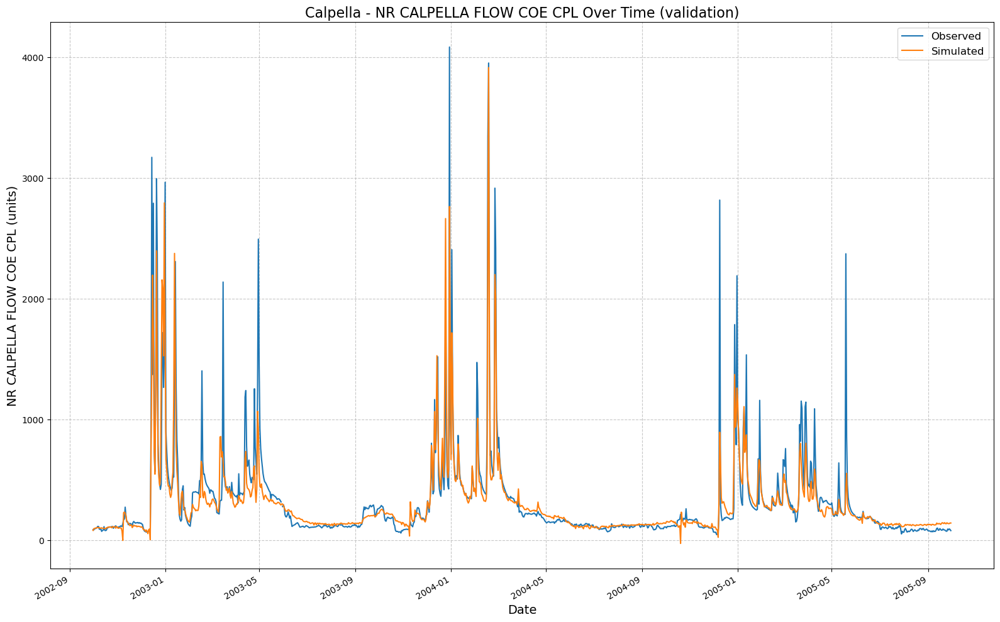

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235038/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:51:58,588: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235158/output.log initialized.
2025-02-12 23:51:58,588: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235158
2025-02-12 23:51:58,588: ### Run configurations for testing_run
2025-02-12 23:51:58,589: experiment_name: testing_run
2025-02-12 23:51:58,589: train_basin_file: calpella
2025-02-12 23:51:58,589: validation_basin_file: calpella
2025-02-12 23:51:58,590: test_basin_file: calpella
2025-02-12 23:51:58,590: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:51:58,590: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.99it/s]
2025-02-12 23:51:58,715: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1011.89it/s]
2025-02-12 23:51:58,721: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.29it/s, Loss: 0.0000]
2025-02-12 23:52:01,471: Epoch 1 average loss: avg_loss: 0.00001, avg_total_loss: 0.00001
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.78it/s, Loss: 0.0000]
2025-02-12 23:52:03,776: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.85it/s, Loss: 0.0000]
2025-02-12 23:52:06,047: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.86it/s, Loss: 0.0000]
2025-02-12 23:52:08,316: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, Loss: 0.0000]
2025-02-12 23:52:10,576: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]
2025-02-12 23:52:41,045: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235158/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:52:41,046: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235158/validation/model_epoch016/validation_results.p
got predictions


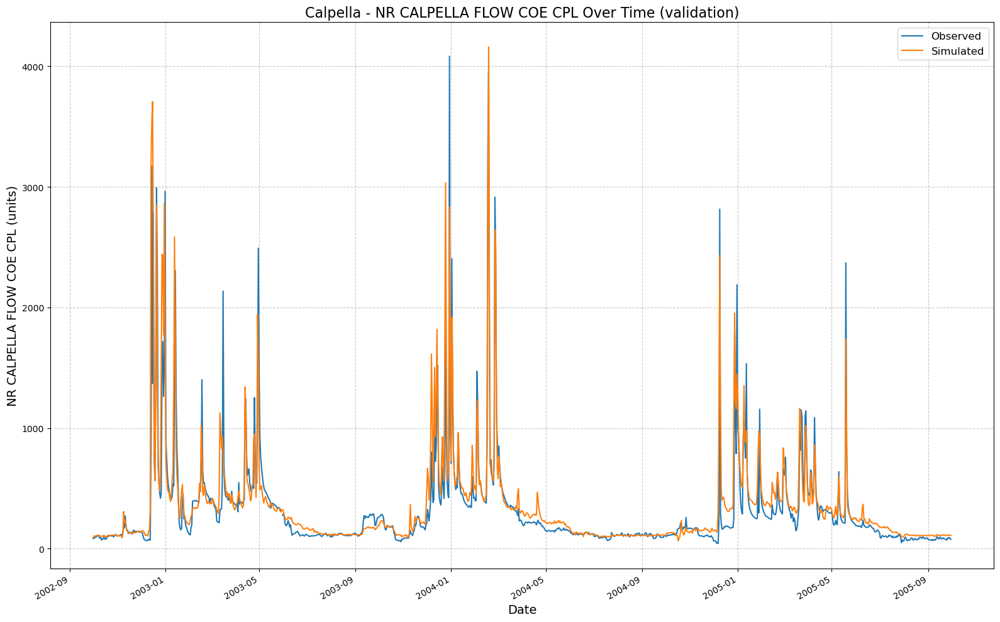

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235158/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:52:41,284: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235241/output.log initialized.
2025-02-12 23:52:41,284: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235241
2025-02-12 23:52:41,285: ### Run configurations for testing_run
2025-02-12 23:52:41,285: experiment_name: testing_run
2025-02-12 23:52:41,285: train_basin_file: calpella
2025-02-12 23:52:41,286: validation_basin_file: calpella
2025-02-12 23:52:41,286: test_basin_file: calpella
2025-02-12 23:52:41,286: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:52:41,286: train_end_date: 2002-09-30

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.56it/s]
2025-02-12 23:52:41,402: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1317.72it/s]
2025-02-12 23:52:41,406: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.29it/s, Loss: 0.0000]
2025-02-12 23:52:44,116: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.75it/s, Loss: 0.0000]
2025-02-12 23:52:46,436: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.81it/s, Loss: 0.0000]
2025-02-12 23:52:48,731: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.84it/s, Loss: 0.0000]
2025-02-12 23:52:51,009: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  3.99it/s, Loss: 0.0000]
2025-02-12 23:52:53,768: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]
2025-02-12 23:54:03,701: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235241/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:54:03,702: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235241/validation/model_epoch032/validation_results.p
got predictions


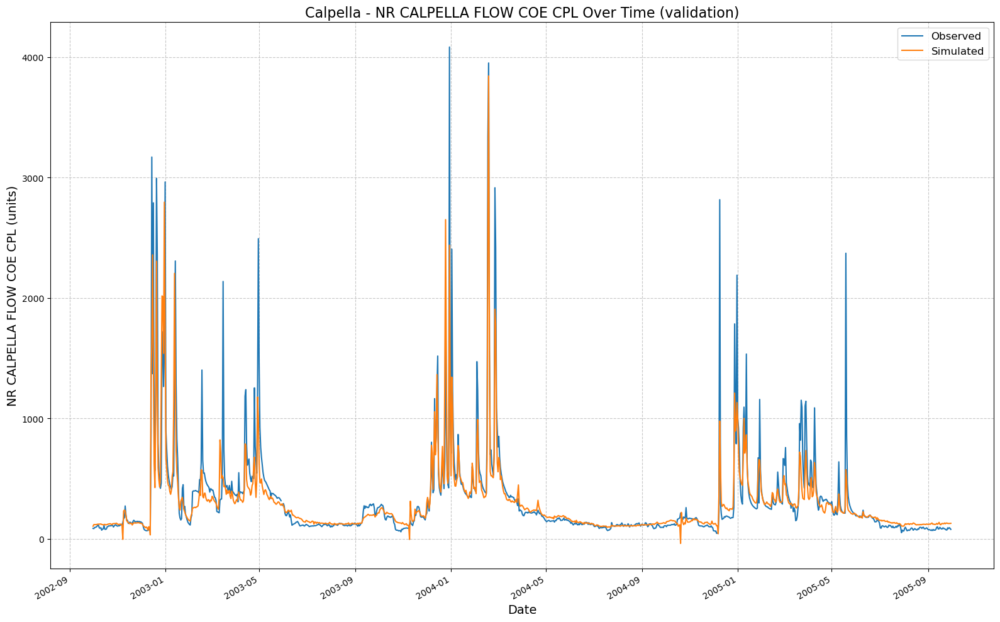

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235241/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:54:03,942: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235403/output.log initialized.
2025-02-12 23:54:03,942: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235403
2025-02-12 23:54:03,942: ### Run configurations for testing_run
2025-02-12 23:54:03,943: experiment_name: testing_run
2025-02-12 23:54:03,943: train_basin_file: calpella
2025-02-12 23:54:03,943: validation_basin_file: calpella
2025-02-12 23:54:03,943: test_basin_file: calpella
2025-02-12 23:54:03,944: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:54:03,944: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.21it/s]
2025-02-12 23:54:04,050: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1655.86it/s]
2025-02-12 23:54:04,054: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-12 23:54:09,271: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-12 23:54:14,297: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-12 23:54:19,322: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.31it/s, Loss: 0.0000]
2025-02-12 23:54:24,096: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.22it/s, Loss: 0.0000]
2025-02-12 23:54:29,046: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]
2025-02-12 23:55:23,638: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235403/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:55:23,639: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235403/validation/model_epoch016/validation_results.p
got predictions


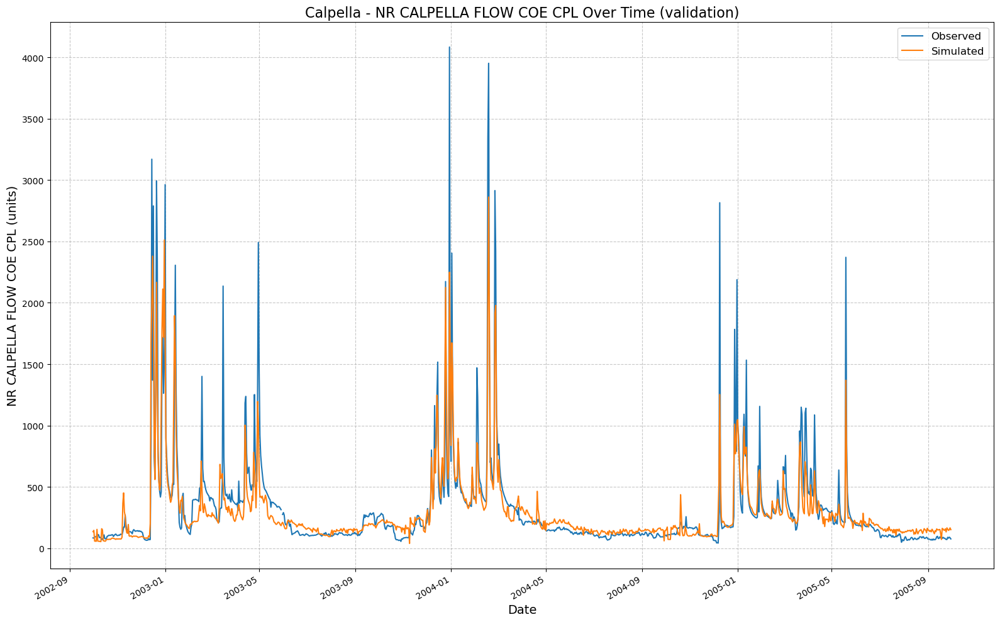

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235403/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:55:23,879: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235523/output.log initialized.
2025-02-12 23:55:23,879: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235523
2025-02-12 23:55:23,879: ### Run configurations for testing_run
2025-02-12 23:55:23,880: experiment_name: testing_run
2025-02-12 23:55:23,880: train_basin_file: calpella
2025-02-12 23:55:23,880: validation_basin_file: calpella
2025-02-12 23:55:23,881: test_basin_file: calpella
2025-02-12 23:55:23,881: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:55:23,881: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.16it/s]
2025-02-12 23:55:24,001: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1481.56it/s]
2025-02-12 23:55:24,006: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.26it/s, Loss: 0.0000]
2025-02-12 23:55:29,035: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.31it/s, Loss: 0.0000]
2025-02-12 23:55:33,796: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.49it/s, Loss: 0.0000]
2025-02-12 23:55:38,216: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.53it/s, Loss: 0.0000]
2025-02-12 23:55:42,560: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.44it/s, Loss: 0.0000]
2025-02-12 23:55:47,077: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]
2025-02-12 23:57:58,556: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235523/validation/model_epoch032/validation_metrics.csv
2025-02-12 23:57:58,558: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235523/validation/model_epoch032/validation_results.p
got predictions


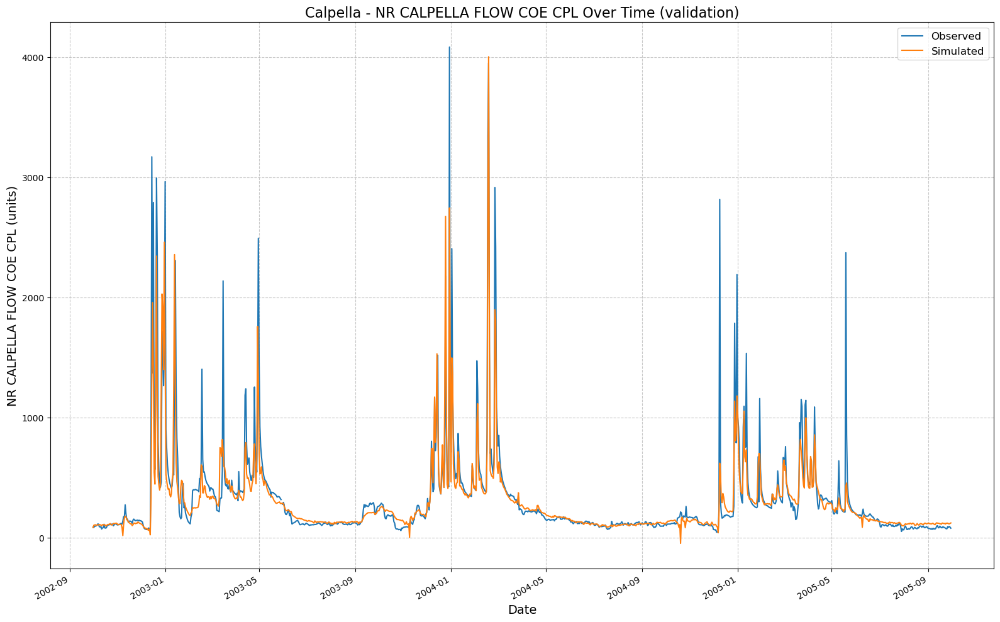

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235523/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 23:57:58,824: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235758/output.log initialized.
2025-02-12 23:57:58,825: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235758
2025-02-12 23:57:58,825: ### Run configurations for testing_run
2025-02-12 23:57:58,825: experiment_name: testing_run
2025-02-12 23:57:58,826: train_basin_file: calpella
2025-02-12 23:57:58,826: validation_basin_file: calpella
2025-02-12 23:57:58,827: test_basin_file: calpella
2025-02-12 23:57:58,827: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:57:58,828: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  8.34it/s]
2025-02-12 23:57:58,974: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1192.24it/s]
2025-02-12 23:57:58,978: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.20it/s, Loss: 0.0000]
2025-02-12 23:58:04,101: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.36it/s, Loss: 0.0000]
2025-02-12 23:58:08,771: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s, Loss: 0.0000]
2025-02-12 23:58:13,346: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.31it/s, Loss: 0.0000]
2025-02-12 23:58:18,101: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.39it/s, Loss: 0.0000]
2025-02-12 23:58:22,707: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]
2025-02-12 23:59:19,015: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235758/validation/model_epoch016/validation_metrics.csv
2025-02-12 23:59:19,016: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235758/validation/model_epoch016/validation_results.p
got predictions


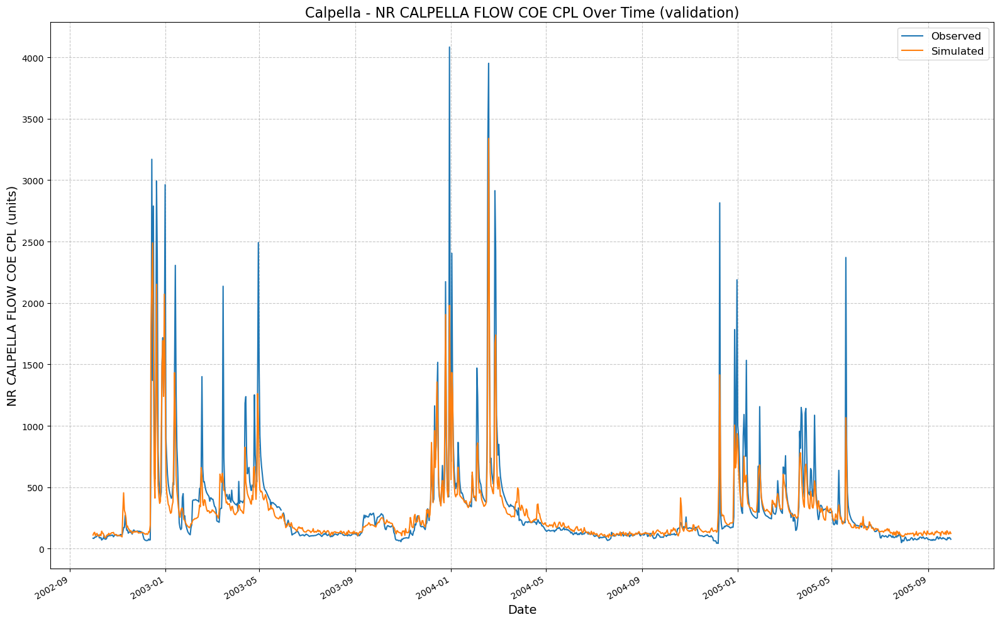

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235758/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 23:59:19,263: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235919/output.log initialized.
2025-02-12 23:59:19,263: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235919
2025-02-12 23:59:19,264: ### Run configurations for testing_run
2025-02-12 23:59:19,264: experiment_name: testing_run
2025-02-12 23:59:19,264: train_basin_file: calpella
2025-02-12 23:59:19,265: validation_basin_file: calpella
2025-02-12 23:59:19,265: test_basin_file: calpella
2025-02-12 23:59:19,265: train_start_date: 1994-10-01 00:00:00
2025-02-12 23:59:19,265: train_end_date: 2002-09-3

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.47it/s]
2025-02-12 23:59:19,382: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1478.95it/s]
2025-02-12 23:59:19,386: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s, Loss: 0.0000]
2025-02-12 23:59:24,075: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s, Loss: 0.0000]
2025-02-12 23:59:28,641: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.26it/s, Loss: 0.0000]
2025-02-12 23:59:33,521: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.45it/s, Loss: 0.0000]
2025-02-12 23:59:38,006: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.49it/s, Loss: 0.0000]
2025-02-12 23:59:42,435: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]
2025-02-13 00:01:56,465: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235919/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:01:56,466: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235919/validation/model_epoch032/validation_results.p
got predictions


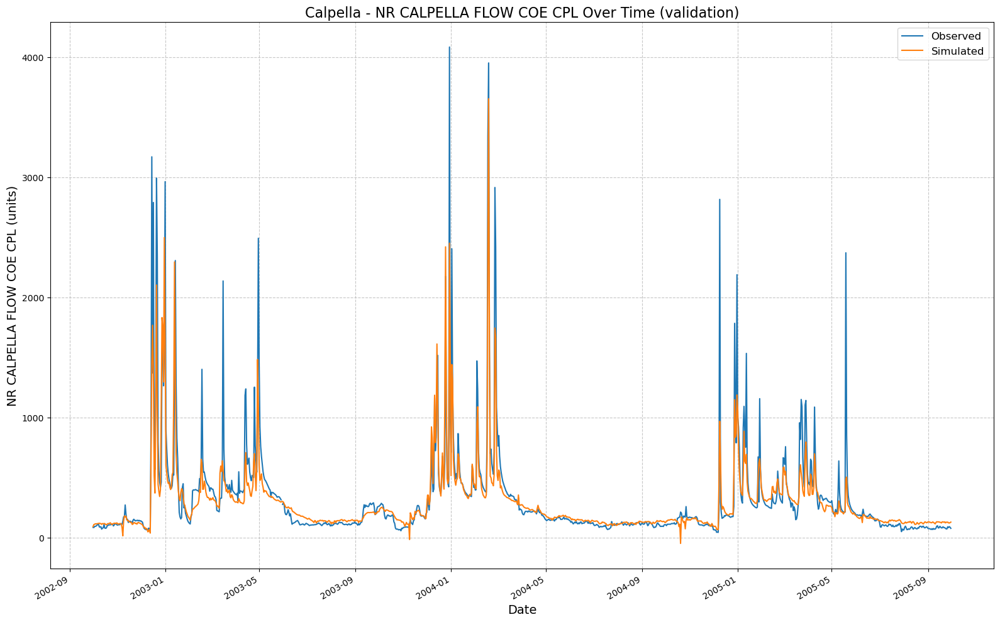

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1202_235919/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [12]:
for (hs, seq, nl, ep) in itertools.product(
        hyperparam_space["hidden_size"],
        hyperparam_space["seq_length"],
        hyperparam_space["num_layers"],
        hyperparam_space["epochs"]
):
    hp = {
        "hidden_size": hs,
        "seq_length": seq,
        "num_layers": nl,
        "epochs": ep,
        "output_dropout": fixed_dropout,
    }
    print(f"NoPhysics: {hp}")
    trainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=hp,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=False,
        extend_train_period=False,
        gpu=-1
    )
    trainer.train()
    csv_path, metrics_dict = trainer.results()
    row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
    for k, v in metrics_dict.items():
        row_data[k] = v
    no_physics_results.append(row_data)

Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:01:56,701: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000156/output.log initialized.
2025-02-13 00:01:56,702: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000156
2025-02-13 00:01:56,702: ### Run configurations for testing_run
2025-02-13 00:01:56,702: experiment_name: testing_run
2025-02-13 00:01:56,703: train_basin_file: calpella
2025-02-13 00:01:56,703: validation_basin_file: calpella
2025-02-13 00:01:56,704: test_basin_file: calpella
2025-02-13 00:01:56,704: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:01:56,704: train_end_date: 2002-09-30 00:00:00
2025-02-13 00:01:56,704: validation_start_date: 2002-10-01 00:00:00
2025-02-13 00:01:56,705: validation_end_date: 2005-09-30 00:00:00
2025-02-13 00:01:5

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]
2025-02-13 00:02:10,566: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000156/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:02:10,567: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000156/validation/model_epoch016/validation_results.p
got predictions


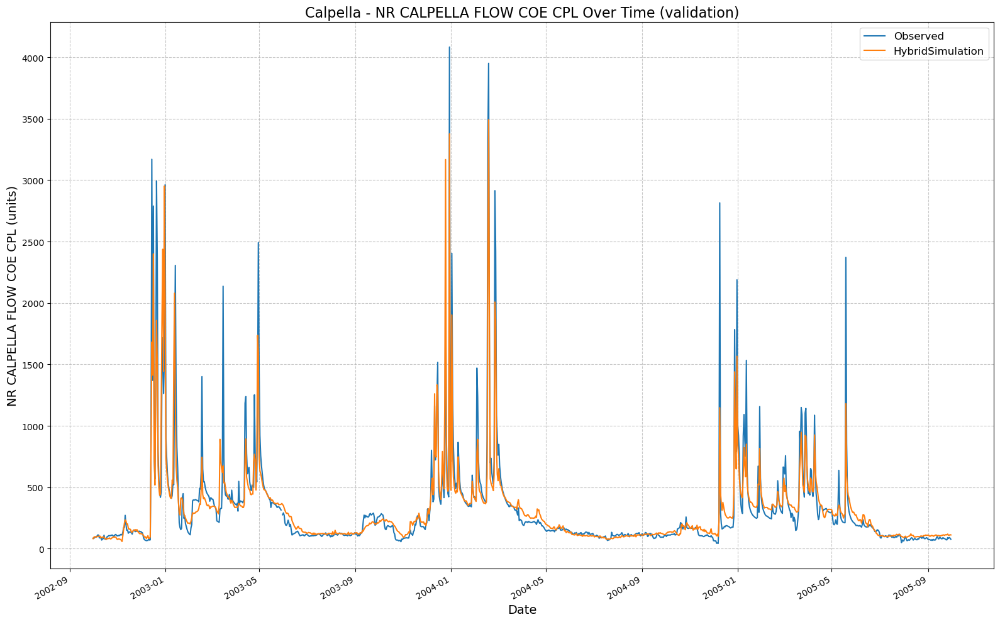

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000156/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:02:10,807: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000210/output.log initialized.
2025-02-13 00:02:10,808: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000210
2025-02-13 00:02:10,808: ### Run configurations for testing_run
2025-02-13 00:02:10,809: experiment_name: testing_run
2025-02-13 00:02:10,809: train_basin_file: calpella
2025-02-13 00:02:10,809: validation_basin_file: calpella
2025-02-13 00:02:10,810: test_basin_file: calpella
2025-02-13 00:02:10,810: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:02:10,810: train_end_date: 2002-09-30 00

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.79it/s]
2025-02-13 00:02:10,976: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1144.11it/s]
2025-02-13 00:02:10,982: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 15.13it/s, Loss: 0.0000]
2025-02-13 00:02:11,848: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.48it/s, Loss: 0.0000]
2025-02-13 00:02:12,609: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 14.40it/s, Loss: 0.0000]
2025-02-13 00:02:13,376: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 14.13it/s, Loss: 0.0000]
2025-02-13 00:02:14,158: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 14.40it/s, Loss: 0.0000]
2025-02-13 00:02:14,926: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]
2025-02-13 00:02:38,782: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000210/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:02:38,783: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000210/validation/model_epoch032/validation_results.p
got predictions


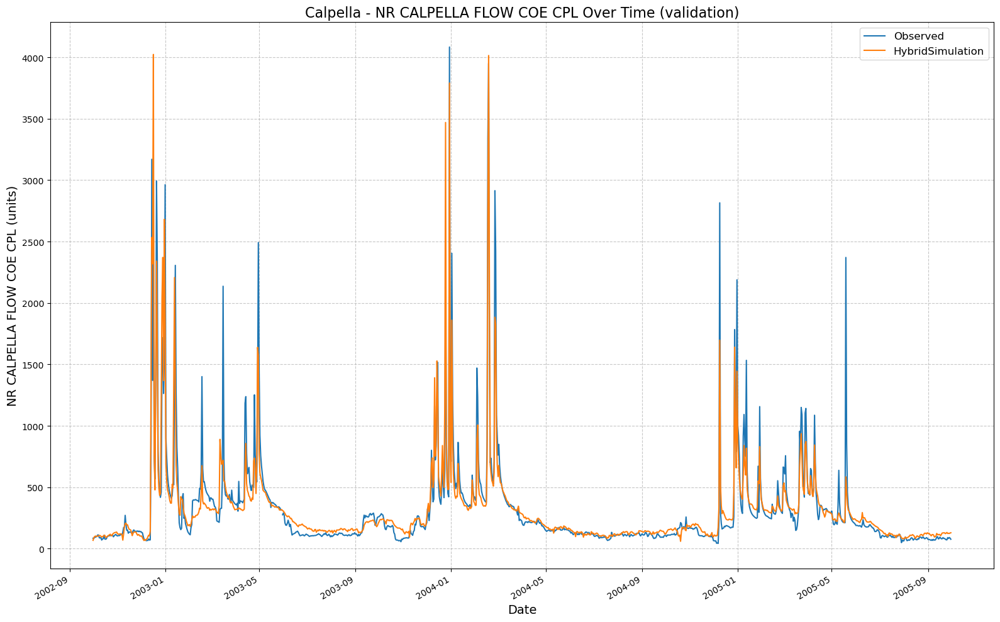

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000210/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:02:39,054: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000239/output.log initialized.
2025-02-13 00:02:39,054: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000239
2025-02-13 00:02:39,055: ### Run configurations for testing_run
2025-02-13 00:02:39,055: experiment_name: testing_run
2025-02-13 00:02:39,055: train_basin_file: calpella
2025-02-13 00:02:39,055: validation_basin_file: calpella
2025-02-13 00:02:39,056: test_basin_file: calpella
2025-02-13 00:02:39,056: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:02:39,056: train_end_date: 2002-09-30 00

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.45it/s]
2025-02-13 00:02:39,256: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1125.99it/s]
2025-02-13 00:02:39,262: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.36it/s, Loss: 0.0000]
2025-02-13 00:02:40,226: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.26it/s, Loss: 0.0000]
2025-02-13 00:02:41,001: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 13.98it/s, Loss: 0.0000]
2025-02-13 00:02:41,791: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.94it/s, Loss: 0.0000]
2025-02-13 00:02:42,583: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.78it/s, Loss: 0.0000]
2025-02-13 00:02:43,383: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]
2025-02-13 00:02:53,482: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000239/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:02:53,483: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000239/validation/model_epoch016/validation_results.p
got predictions


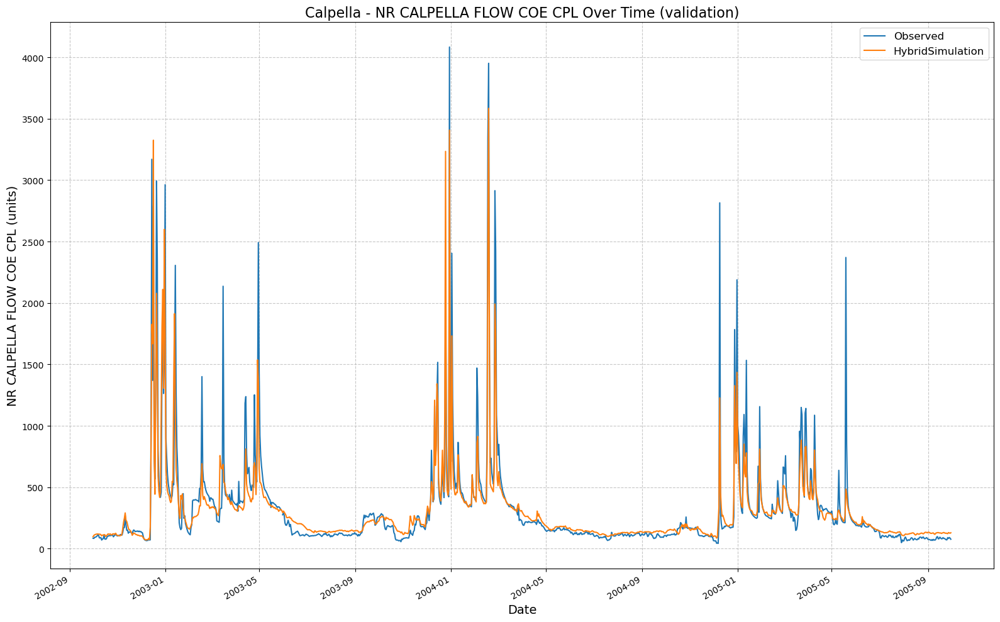

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000239/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:02:53,721: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000253/output.log initialized.
2025-02-13 00:02:53,722: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000253
2025-02-13 00:02:53,722: ### Run configurations for testing_run
2025-02-13 00:02:53,723: experiment_name: testing_run
2025-02-13 00:02:53,723: train_basin_file: calpella
2025-02-13 00:02:53,723: validation_basin_file: calpella
2025-02-13 00:02:53,724: test_basin_file: calpella
2025-02-13 00:02:53,724: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:02:53,724: train_end_date: 2002-09-30 00

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.01it/s]
2025-02-13 00:02:53,887: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1140.38it/s]
2025-02-13 00:02:53,893: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.59it/s, Loss: 0.0000]
2025-02-13 00:02:54,843: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 14.65it/s, Loss: 0.0000]
2025-02-13 00:02:55,596: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 15.13it/s, Loss: 0.0000]
2025-02-13 00:02:56,326: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.21it/s, Loss: 0.0000]
2025-02-13 00:02:57,161: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.90it/s, Loss: 0.0000]
2025-02-13 00:02:57,955: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]
2025-02-13 00:03:22,181: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000253/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:03:22,183: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000253/validation/model_epoch032/validation_results.p
got predictions


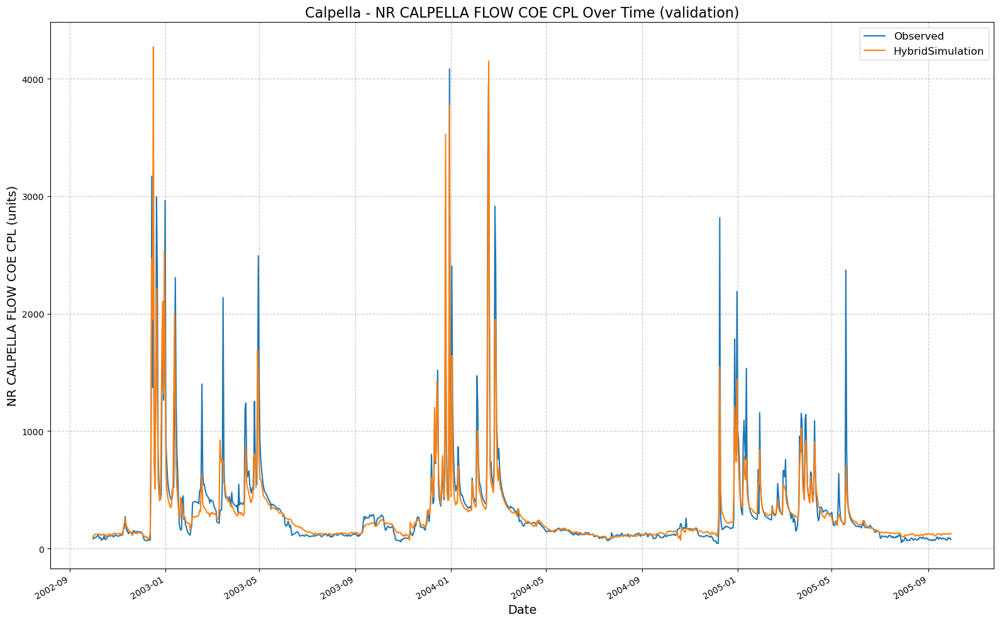

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000253/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:03:22,415: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000322/output.log initialized.
2025-02-13 00:03:22,416: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000322
2025-02-13 00:03:22,416: ### Run configurations for testing_run
2025-02-13 00:03:22,417: experiment_name: testing_run
2025-02-13 00:03:22,417: train_basin_file: calpella
2025-02-13 00:03:22,418: validation_basin_file: calpella
2025-02-13 00:03:22,418: test_basin_file: calpella
2025-02-13 00:03:22,419: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:03:22,419: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2025-02-13 00:03:22,604: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 996.04it/s]
2025-02-13 00:03:22,613: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.54it/s, Loss: 0.0000]
2025-02-13 00:03:24,053: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.87it/s, Loss: 0.0000]
2025-02-13 00:03:25,454: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.47it/s, Loss: 0.0000]
2025-02-13 00:03:26,756: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.98it/s, Loss: 0.0000]
2025-02-13 00:03:28,137: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.67it/s, Loss: 0.0000]
2025-02-13 00:03:29,574: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]
2025-02-13 00:03:46,604: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000322/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:03:46,606: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000322/validation/model_epoch016/validation_results.p
got predictions


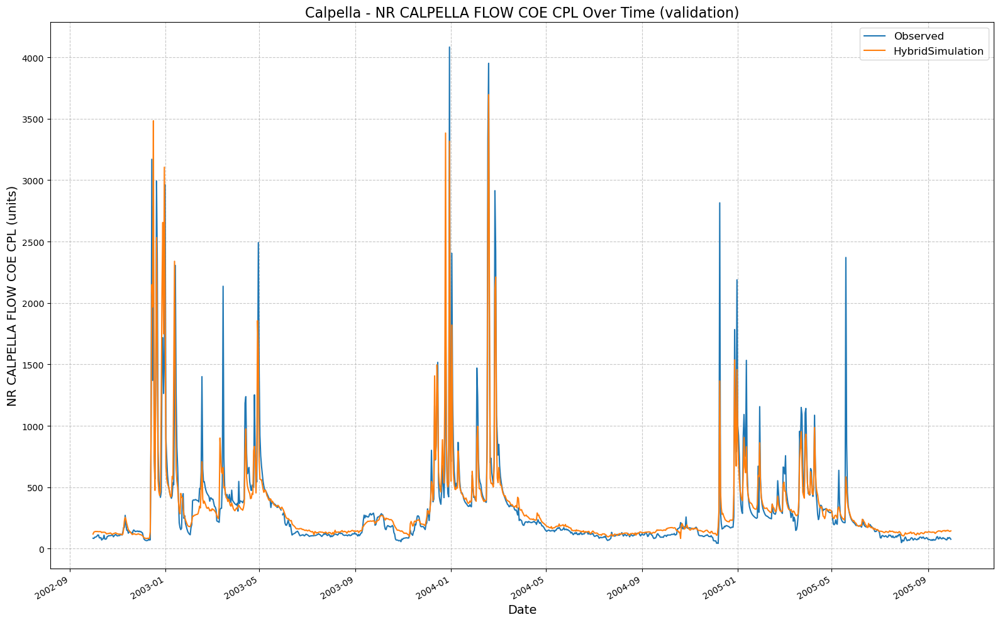

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000322/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:03:46,845: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000346/output.log initialized.
2025-02-13 00:03:46,846: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000346
2025-02-13 00:03:46,847: ### Run configurations for testing_run
2025-02-13 00:03:46,847: experiment_name: testing_run
2025-02-13 00:03:46,847: train_basin_file: calpella
2025-02-13 00:03:46,848: validation_basin_file: calpella
2025-02-13 00:03:46,848: test_basin_file: calpella
2025-02-13 00:03:46,848: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:03:46,848: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.32it/s]
2025-02-13 00:03:47,002: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1328.15it/s]
2025-02-13 00:03:47,007: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.75it/s, Loss: 0.0000]
2025-02-13 00:03:48,548: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-13 00:03:49,914: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.10it/s, Loss: 0.0000]
2025-02-13 00:03:51,276: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.14it/s, Loss: 0.0000]
2025-02-13 00:03:52,630: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.20it/s, Loss: 0.0000]
2025-02-13 00:03:53,829: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]
2025-02-13 00:04:34,558: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000346/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:04:34,559: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000346/validation/model_epoch032/validation_results.p
got predictions


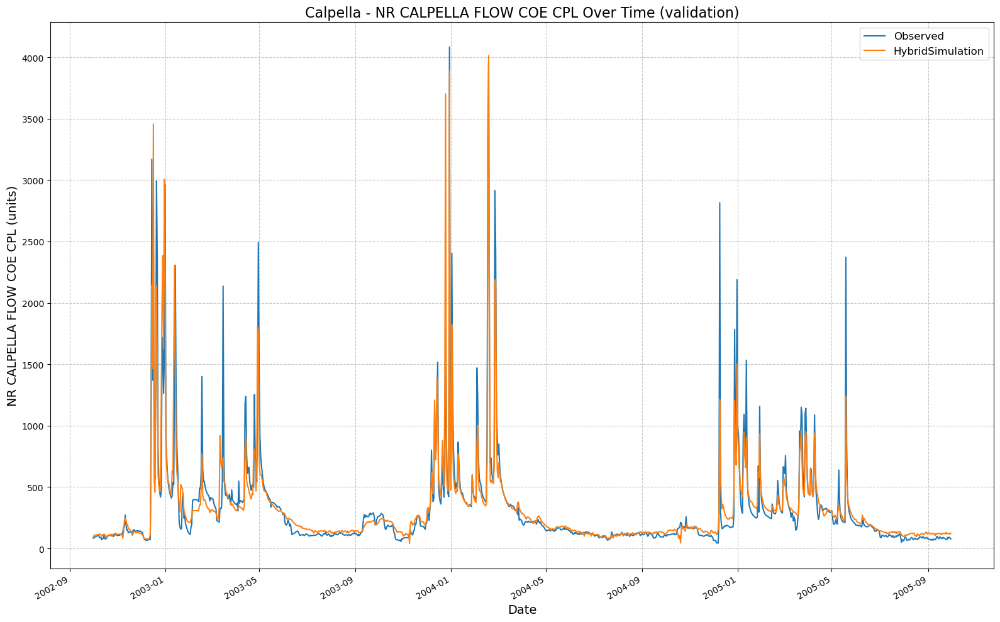

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000346/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:04:34,808: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000434/output.log initialized.
2025-02-13 00:04:34,808: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000434
2025-02-13 00:04:34,809: ### Run configurations for testing_run
2025-02-13 00:04:34,809: experiment_name: testing_run
2025-02-13 00:04:34,809: train_basin_file: calpella
2025-02-13 00:04:34,810: validation_basin_file: calpella
2025-02-13 00:04:34,810: test_basin_file: calpella
2025-02-13 00:04:34,810: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:04:34,811: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.88it/s]
2025-02-13 00:04:34,976: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 835.35it/s]
2025-02-13 00:04:34,982: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.21it/s, Loss: 0.0000]
2025-02-13 00:04:36,486: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.05it/s, Loss: 0.0000]
2025-02-13 00:04:37,856: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.97it/s, Loss: 0.0000]
2025-02-13 00:04:39,239: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.96it/s, Loss: 0.0000]
2025-02-13 00:04:40,625: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.97it/s, Loss: 0.0000]
2025-02-13 00:04:42,007: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]
2025-02-13 00:04:59,012: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000434/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:04:59,016: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000434/validation/model_epoch016/validation_results.p
got predictions


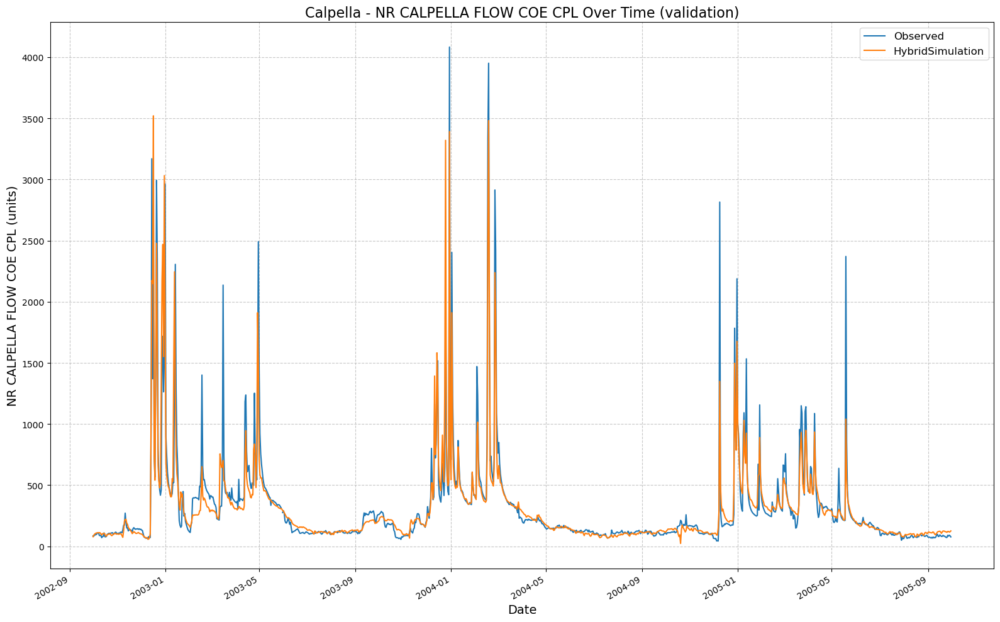

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000434/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:04:59,258: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000459/output.log initialized.
2025-02-13 00:04:59,259: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000459
2025-02-13 00:04:59,259: ### Run configurations for testing_run
2025-02-13 00:04:59,260: experiment_name: testing_run
2025-02-13 00:04:59,260: train_basin_file: calpella
2025-02-13 00:04:59,260: validation_basin_file: calpella
2025-02-13 00:04:59,261: test_basin_file: calpella
2025-02-13 00:04:59,261: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:04:59,261: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2025-02-13 00:04:59,435: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 683.11it/s]
2025-02-13 00:04:59,445: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.84it/s, Loss: 0.0000]
2025-02-13 00:05:01,065: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.83it/s, Loss: 0.0000]
2025-02-13 00:05:02,473: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.84it/s, Loss: 0.0000]
2025-02-13 00:05:03,879: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.75it/s, Loss: 0.0000]
2025-02-13 00:05:05,302: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.86it/s, Loss: 0.0000]
2025-02-13 00:05:06,704: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]
2025-02-13 00:05:47,189: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000459/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:05:47,189: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000459/validation/model_epoch032/validation_results.p
got predictions


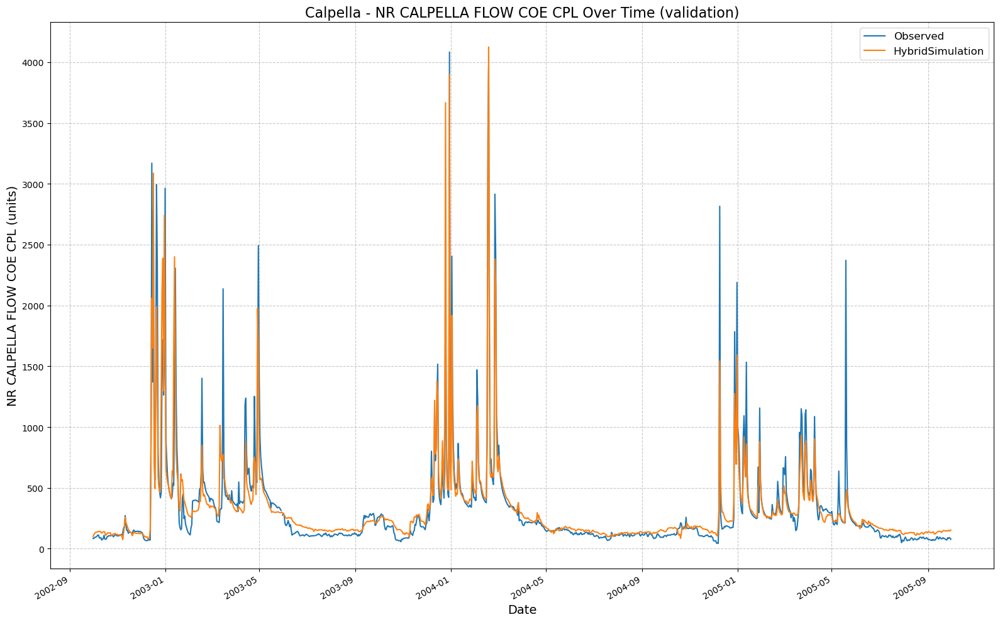

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000459/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:05:47,429: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000547/output.log initialized.
2025-02-13 00:05:47,429: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000547
2025-02-13 00:05:47,430: ### Run configurations for testing_run
2025-02-13 00:05:47,430: experiment_name: testing_run
2025-02-13 00:05:47,430: train_basin_file: calpella
2025-02-13 00:05:47,431: validation_basin_file: calpella
2025-02-13 00:05:47,431: test_basin_file: calpella
2025-02-13 00:05:47,431: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:05:47,431: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.18it/s]
2025-02-13 00:05:47,588: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1560.38it/s]
2025-02-13 00:05:47,593: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.39it/s, Loss: 0.0000]
2025-02-13 00:05:49,023: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.47it/s, Loss: 0.0000]
2025-02-13 00:05:50,325: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.34it/s, Loss: 0.0000]
2025-02-13 00:05:51,647: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.99it/s, Loss: 0.0000]
2025-02-13 00:05:53,027: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.06it/s, Loss: 0.0000]
2025-02-13 00:05:54,395: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]
2025-02-13 00:06:10,837: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000547/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:06:10,838: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000547/validation/model_epoch016/validation_results.p
got predictions


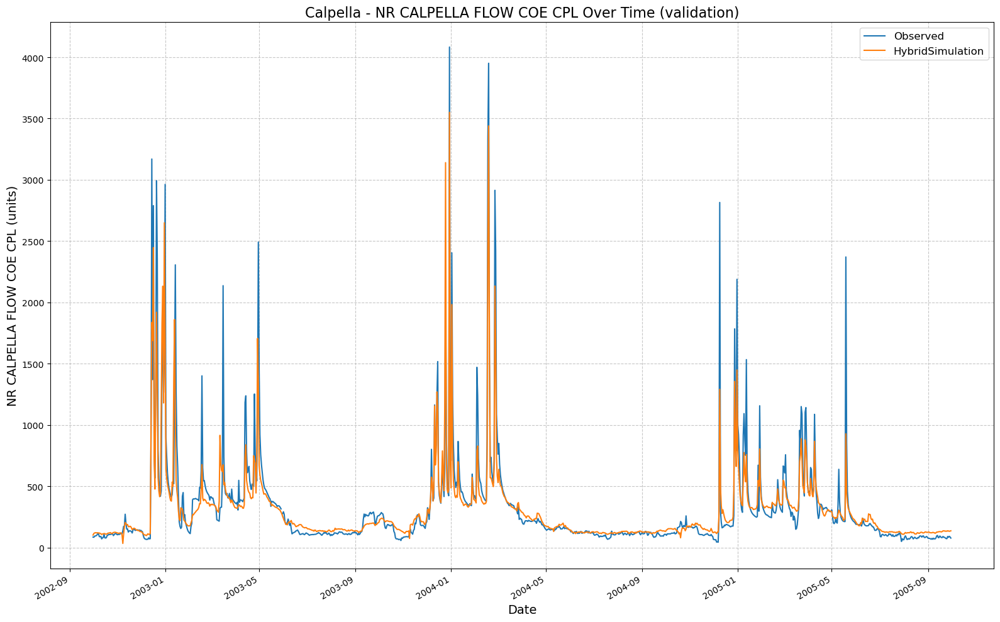

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000547/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:06:11,080: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000611/output.log initialized.
2025-02-13 00:06:11,081: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000611
2025-02-13 00:06:11,081: ### Run configurations for testing_run
2025-02-13 00:06:11,081: experiment_name: testing_run
2025-02-13 00:06:11,082: train_basin_file: calpella
2025-02-13 00:06:11,082: validation_basin_file: calpella
2025-02-13 00:06:11,082: test_basin_file: calpella
2025-02-13 00:06:11,082: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:06:11,083: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.02it/s]
2025-02-13 00:06:11,241: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1186.17it/s]
2025-02-13 00:06:11,247: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  6.86it/s, Loss: 0.0000]
2025-02-13 00:06:12,985: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.20it/s, Loss: 0.0000]
2025-02-13 00:06:14,330: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.85it/s, Loss: 0.0000]
2025-02-13 00:06:15,734: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.28it/s, Loss: 0.0000]
2025-02-13 00:06:17,067: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.28it/s, Loss: 0.0000]
2025-02-13 00:06:18,399: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]
2025-02-13 00:06:57,144: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000611/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:06:57,146: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000611/validation/model_epoch032/validation_results.p
got predictions


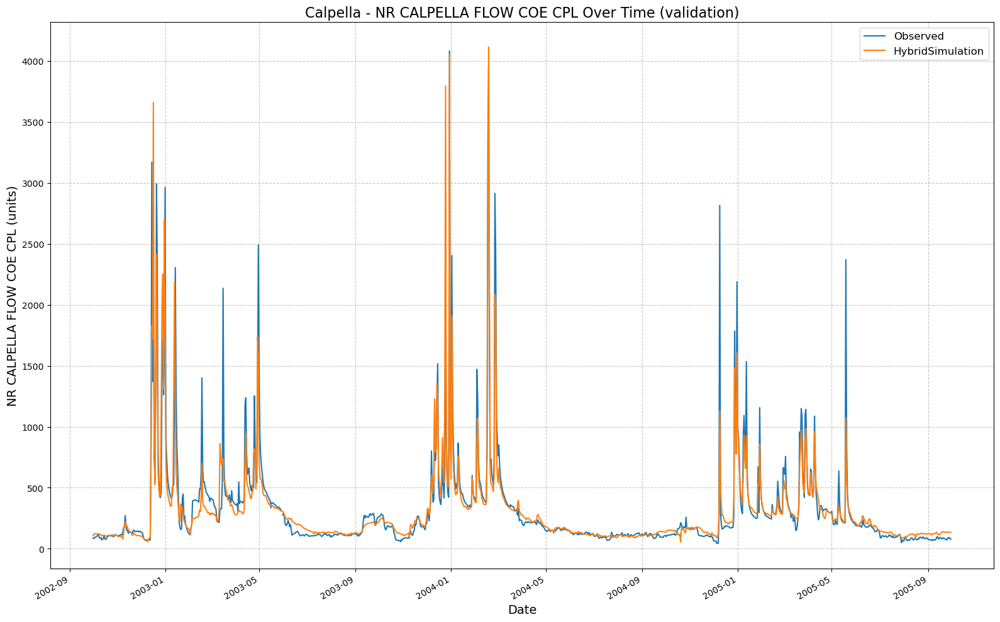

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000611/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:06:57,394: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000657/output.log initialized.
2025-02-13 00:06:57,394: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000657
2025-02-13 00:06:57,395: ### Run configurations for testing_run
2025-02-13 00:06:57,395: experiment_name: testing_run
2025-02-13 00:06:57,395: train_basin_file: calpella
2025-02-13 00:06:57,395: validation_basin_file: calpella
2025-02-13 00:06:57,396: test_basin_file: calpella
2025-02-13 00:06:57,396: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:06:57,396: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.81it/s]
2025-02-13 00:06:57,567: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1286.99it/s]
2025-02-13 00:06:57,573: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.77it/s, Loss: 0.0000]
2025-02-13 00:06:58,965: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-13 00:07:00,330: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.34it/s, Loss: 0.0000]
2025-02-13 00:07:01,653: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.28it/s, Loss: 0.0000]
2025-02-13 00:07:02,986: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.34it/s, Loss: 0.0000]
2025-02-13 00:07:04,308: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]
2025-02-13 00:07:20,628: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000657/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:07:20,629: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000657/validation/model_epoch016/validation_results.p
got predictions


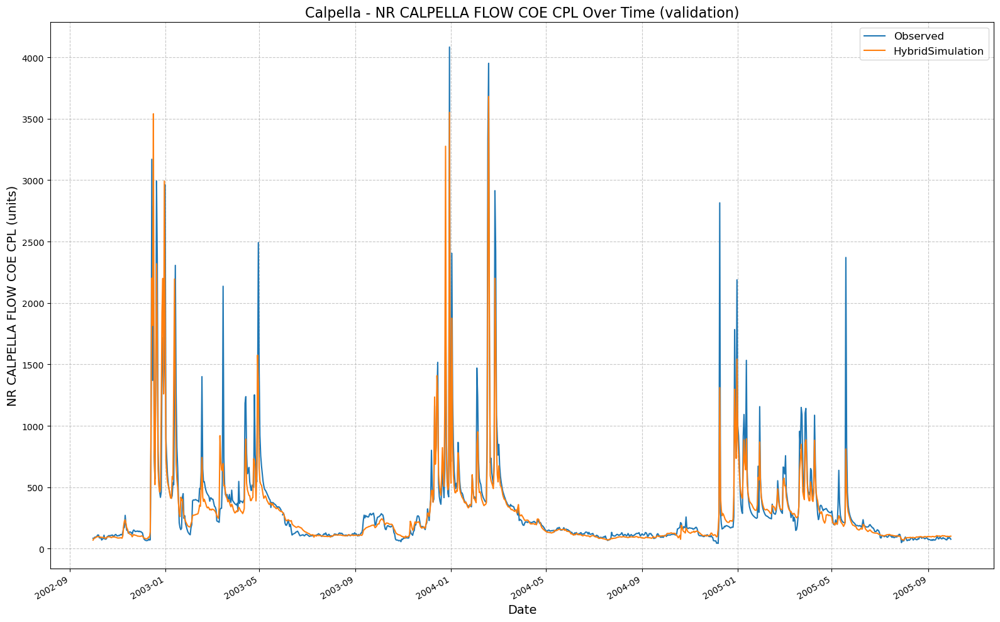

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000657/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:07:20,870: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000720/output.log initialized.
2025-02-13 00:07:20,871: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000720
2025-02-13 00:07:20,871: ### Run configurations for testing_run
2025-02-13 00:07:20,872: experiment_name: testing_run
2025-02-13 00:07:20,872: train_basin_file: calpella
2025-02-13 00:07:20,872: validation_basin_file: calpella
2025-02-13 00:07:20,873: test_basin_file: calpella
2025-02-13 00:07:20,873: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:07:20,873: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.73it/s]
2025-02-13 00:07:21,041: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1225.33it/s]
2025-02-13 00:07:21,047: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.01it/s, Loss: 0.0000]
2025-02-13 00:07:22,399: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.85it/s, Loss: 0.0000]
2025-02-13 00:07:23,518: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.42it/s, Loss: 0.0000]
2025-02-13 00:07:24,828: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.12it/s, Loss: 0.0000]
2025-02-13 00:07:26,038: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.41it/s, Loss: 0.0000]
2025-02-13 00:07:27,350: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]
2025-02-13 00:08:05,773: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000720/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:08:05,774: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000720/validation/model_epoch032/validation_results.p
got predictions


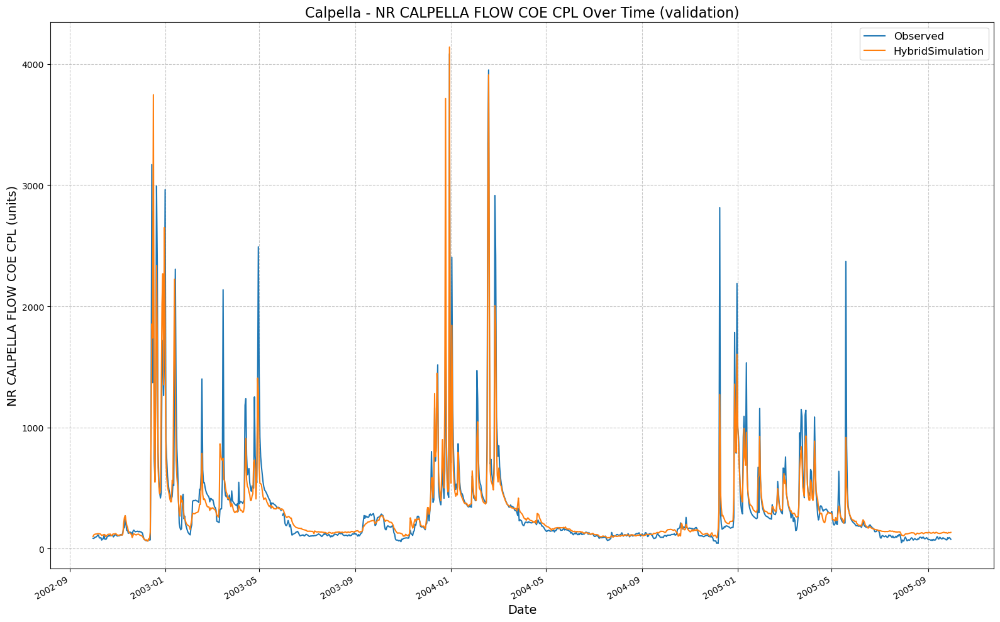

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000720/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:08:06,008: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000806/output.log initialized.
2025-02-13 00:08:06,008: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000806
2025-02-13 00:08:06,009: ### Run configurations for testing_run
2025-02-13 00:08:06,009: experiment_name: testing_run
2025-02-13 00:08:06,010: train_basin_file: calpella
2025-02-13 00:08:06,010: validation_basin_file: calpella
2025-02-13 00:08:06,011: test_basin_file: calpella
2025-02-13 00:08:06,011: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:08:06,012: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2025-02-13 00:08:06,190: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1291.75it/s]
2025-02-13 00:08:06,196: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.28it/s, Loss: 0.0000]
2025-02-13 00:08:08,897: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-13 00:08:11,247: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.63it/s, Loss: 0.0000]
2025-02-13 00:08:13,623: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.60it/s, Loss: 0.0000]
2025-02-13 00:08:16,017: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.73it/s, Loss: 0.0000]
2025-02-13 00:08:18,345: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]
2025-02-13 00:08:46,984: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000806/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:08:46,985: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000806/validation/model_epoch016/validation_results.p
got predictions


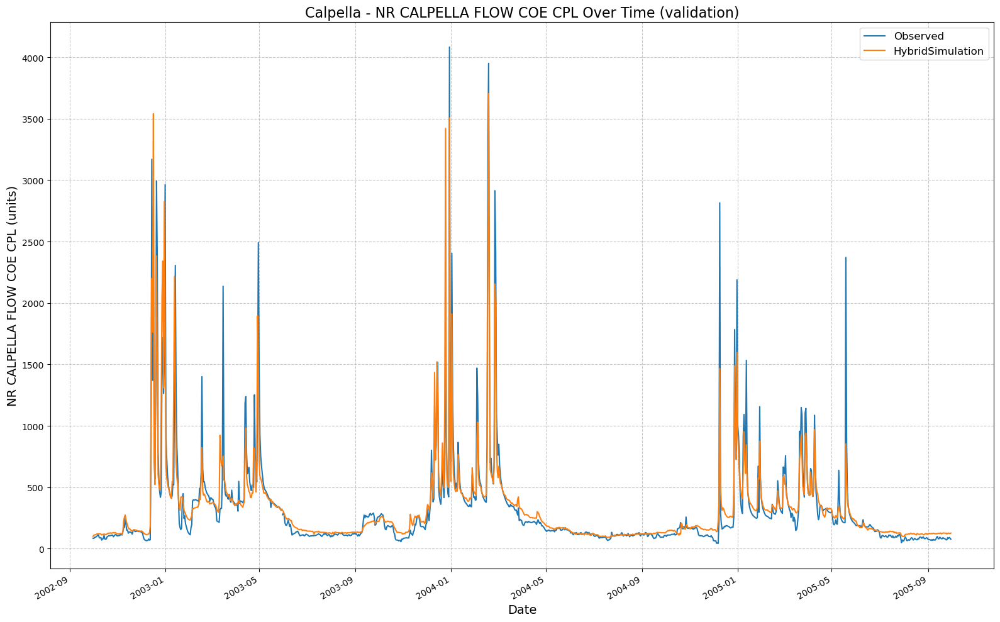

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000806/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:08:47,226: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000847/output.log initialized.
2025-02-13 00:08:47,226: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000847
2025-02-13 00:08:47,226: ### Run configurations for testing_run
2025-02-13 00:08:47,226: experiment_name: testing_run
2025-02-13 00:08:47,227: train_basin_file: calpella
2025-02-13 00:08:47,227: validation_basin_file: calpella
2025-02-13 00:08:47,228: test_basin_file: calpella
2025-02-13 00:08:47,228: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:08:47,228: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.84it/s]
2025-02-13 00:08:47,396: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1063.73it/s]
2025-02-13 00:08:47,402: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.75it/s, Loss: 0.0000]
2025-02-13 00:08:49,842: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.70it/s, Loss: 0.0000]
2025-02-13 00:08:52,187: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.82it/s, Loss: 0.0000]
2025-02-13 00:08:54,472: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.82it/s, Loss: 0.0000]
2025-02-13 00:08:56,760: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.74it/s, Loss: 0.0000]
2025-02-13 00:08:59,083: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]
2025-02-13 00:10:07,927: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000847/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:10:07,927: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000847/validation/model_epoch032/validation_results.p
got predictions


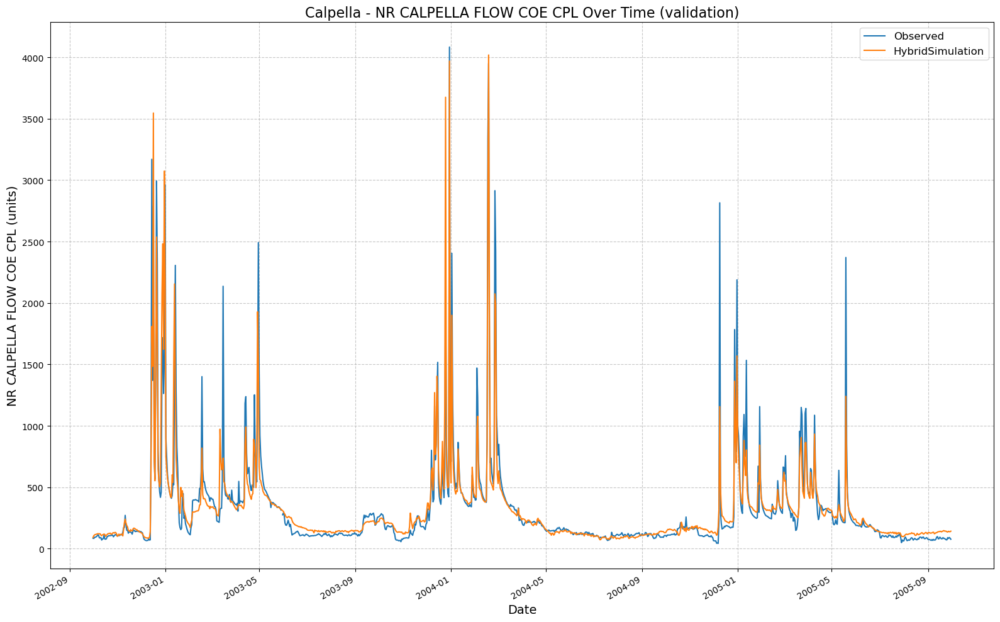

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_000847/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:10:08,172: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001008/output.log initialized.
2025-02-13 00:10:08,173: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001008
2025-02-13 00:10:08,173: ### Run configurations for testing_run
2025-02-13 00:10:08,174: experiment_name: testing_run
2025-02-13 00:10:08,174: train_basin_file: calpella
2025-02-13 00:10:08,175: validation_basin_file: calpella
2025-02-13 00:10:08,175: test_basin_file: calpella
2025-02-13 00:10:08,175: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:10:08,176: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
2025-02-13 00:10:08,352: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 834.19it/s]
2025-02-13 00:10:08,358: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.54it/s, Loss: 0.0000]
2025-02-13 00:10:10,915: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-13 00:10:13,265: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-13 00:10:15,710: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.68it/s, Loss: 0.0000]
2025-02-13 00:10:18,063: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.71it/s, Loss: 0.0000]
2025-02-13 00:10:20,403: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]
2025-02-13 00:10:49,698: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001008/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:10:49,699: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001008/validation/model_epoch016/validation_results.p
got predictions


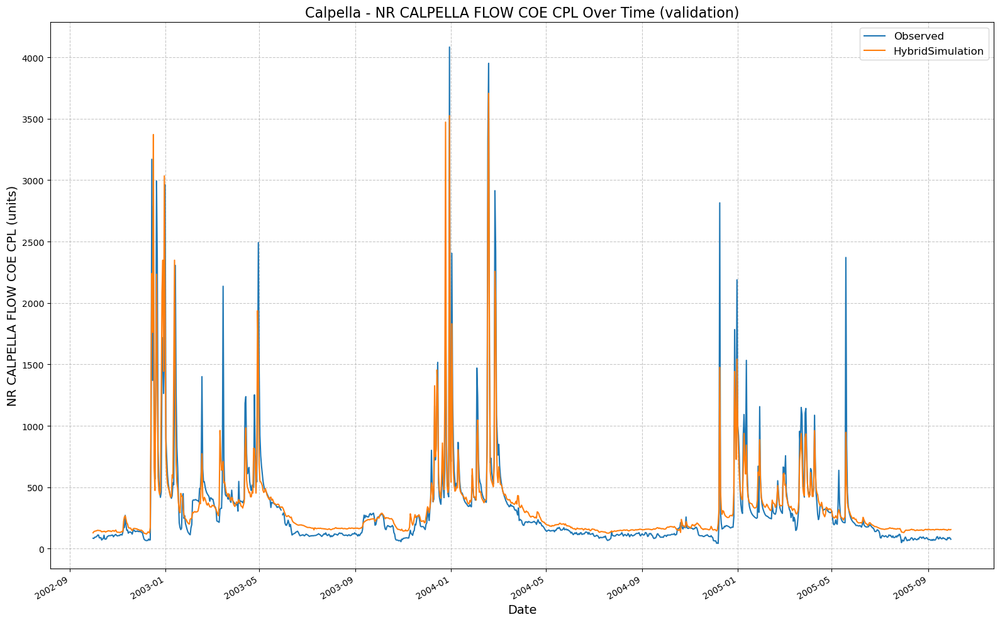

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001008/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:10:49,941: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001049/output.log initialized.
2025-02-13 00:10:49,942: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001049
2025-02-13 00:10:49,942: ### Run configurations for testing_run
2025-02-13 00:10:49,942: experiment_name: testing_run
2025-02-13 00:10:49,943: train_basin_file: calpella
2025-02-13 00:10:49,943: validation_basin_file: calpella
2025-02-13 00:10:49,943: test_basin_file: calpella
2025-02-13 00:10:49,944: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:10:49,944: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.70it/s]
2025-02-13 00:10:50,113: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1326.47it/s]
2025-02-13 00:10:50,119: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.66it/s, Loss: 0.0000]
2025-02-13 00:10:52,609: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-13 00:10:55,008: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.86it/s, Loss: 0.0000]
2025-02-13 00:10:57,276: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.58it/s, Loss: 0.0000]
2025-02-13 00:10:59,682: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.52it/s, Loss: 0.0000]
2025-02-13 00:11:02,123: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]
2025-02-13 00:12:12,092: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001049/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:12:12,094: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001049/validation/model_epoch032/validation_results.p
got predictions


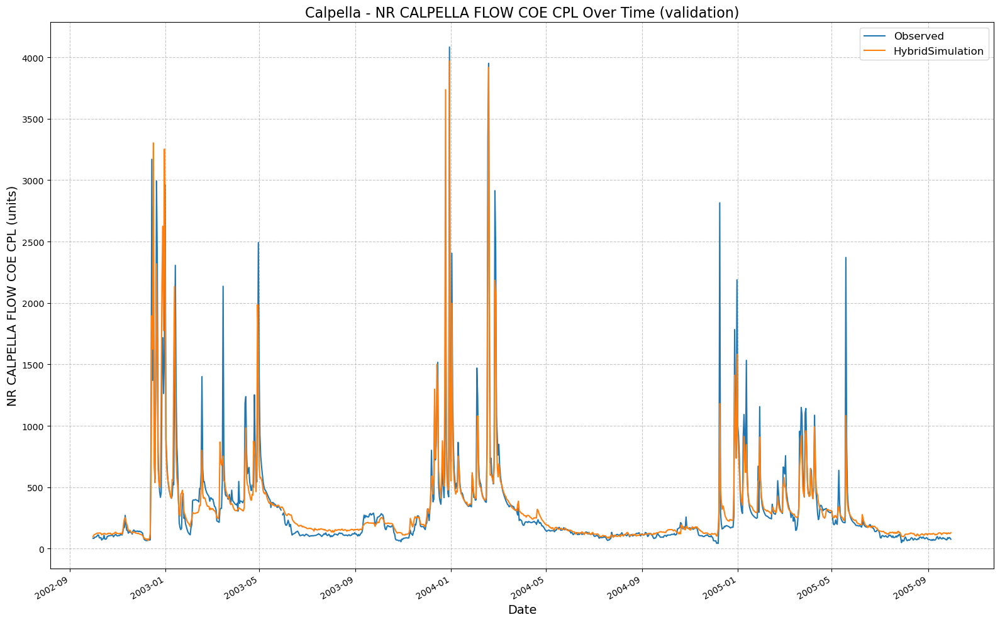

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001049/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:12:12,345: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001212/output.log initialized.
2025-02-13 00:12:12,345: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001212
2025-02-13 00:12:12,346: ### Run configurations for testing_run
2025-02-13 00:12:12,346: experiment_name: testing_run
2025-02-13 00:12:12,346: train_basin_file: calpella
2025-02-13 00:12:12,347: validation_basin_file: calpella
2025-02-13 00:12:12,347: test_basin_file: calpella
2025-02-13 00:12:12,347: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:12:12,347: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2025-02-13 00:12:12,535: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1302.17it/s]
2025-02-13 00:12:12,540: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.70it/s, Loss: 0.0000]
2025-02-13 00:12:15,027: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.53it/s, Loss: 0.0000]
2025-02-13 00:12:17,459: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.68it/s, Loss: 0.0000]
2025-02-13 00:12:19,814: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.72it/s, Loss: 0.0000]
2025-02-13 00:12:22,148: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.74it/s, Loss: 0.0000]
2025-02-13 00:12:24,473: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]
2025-02-13 00:12:53,246: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001212/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:12:53,247: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001212/validation/model_epoch016/validation_results.p
got predictions


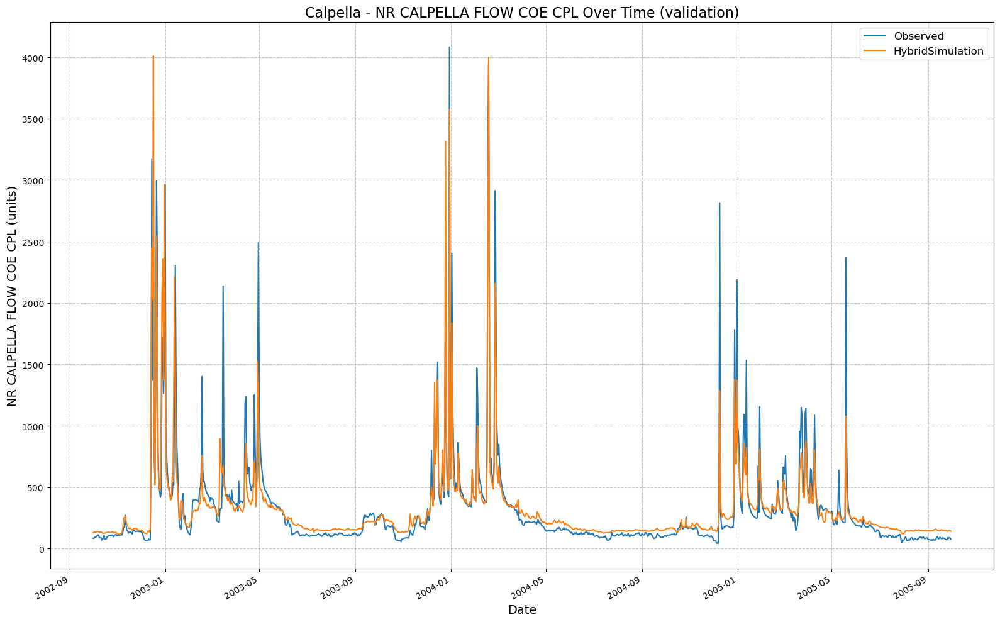

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001212/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:12:53,485: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001253/output.log initialized.
2025-02-13 00:12:53,485: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001253
2025-02-13 00:12:53,486: ### Run configurations for testing_run
2025-02-13 00:12:53,486: experiment_name: testing_run
2025-02-13 00:12:53,487: train_basin_file: calpella
2025-02-13 00:12:53,487: validation_basin_file: calpella
2025-02-13 00:12:53,487: test_basin_file: calpella
2025-02-13 00:12:53,488: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:12:53,488: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2025-02-13 00:12:53,660: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 914.79it/s]
2025-02-13 00:12:53,668: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s, Loss: 0.0000]
2025-02-13 00:12:56,331: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.45it/s, Loss: 0.0000]
2025-02-13 00:12:58,807: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  3.77it/s, Loss: 0.0000]
2025-02-13 00:13:01,728: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-13 00:13:04,078: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-13 00:13:06,426: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]
2025-02-13 00:14:15,396: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001253/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:14:15,396: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001253/validation/model_epoch032/validation_results.p
got predictions


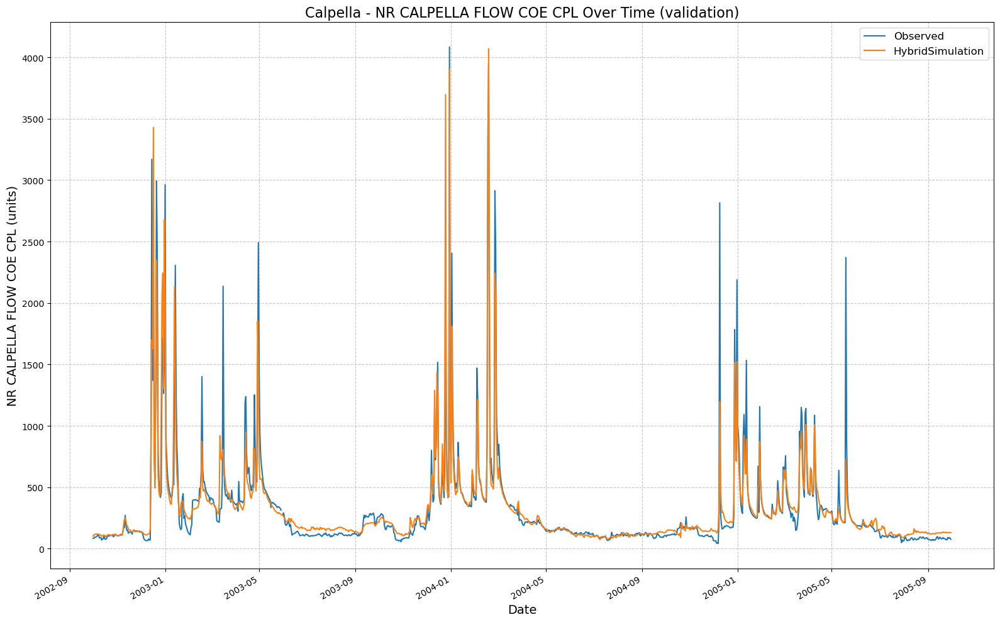

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001253/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:14:15,644: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001415/output.log initialized.
2025-02-13 00:14:15,644: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001415
2025-02-13 00:14:15,645: ### Run configurations for testing_run
2025-02-13 00:14:15,645: experiment_name: testing_run
2025-02-13 00:14:15,645: train_basin_file: calpella
2025-02-13 00:14:15,646: validation_basin_file: calpella
2025-02-13 00:14:15,646: test_basin_file: calpella
2025-02-13 00:14:15,646: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:14:15,646: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.82it/s]
2025-02-13 00:14:15,812: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1274.09it/s]
2025-02-13 00:14:15,817: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.55it/s, Loss: 0.0000]
2025-02-13 00:14:18,367: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s, Loss: 0.0000]
2025-02-13 00:14:20,896: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.48it/s, Loss: 0.0000]
2025-02-13 00:14:23,353: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.47it/s, Loss: 0.0000]
2025-02-13 00:14:25,817: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.33it/s, Loss: 0.0000]
2025-02-13 00:14:28,358: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]
2025-02-13 00:14:59,089: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001415/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:14:59,091: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001415/validation/model_epoch016/validation_results.p
got predictions


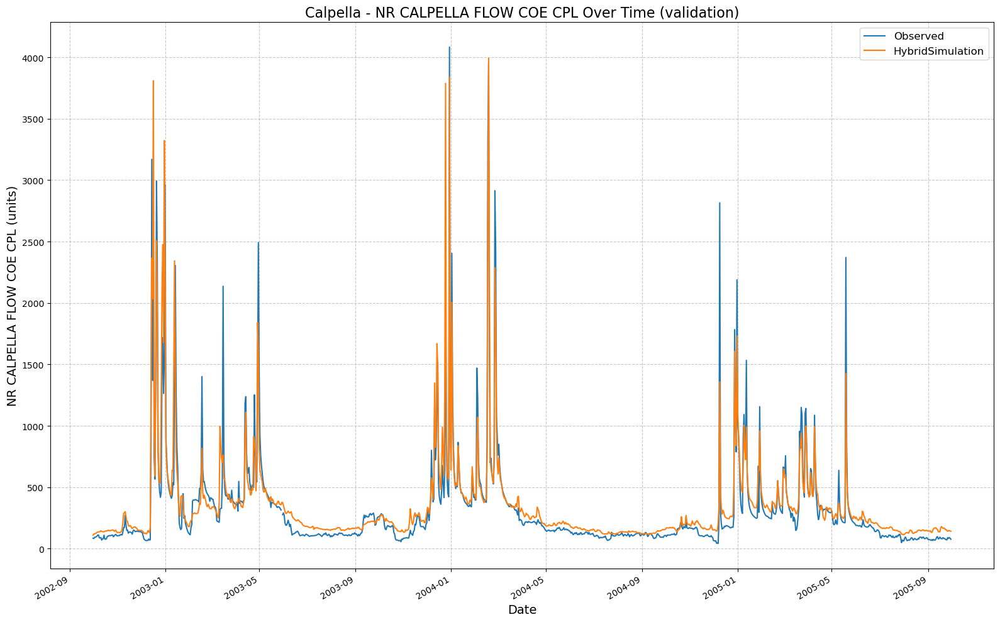

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001415/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:14:59,536: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001459/output.log initialized.
2025-02-13 00:14:59,537: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001459
2025-02-13 00:14:59,537: ### Run configurations for testing_run
2025-02-13 00:14:59,537: experiment_name: testing_run
2025-02-13 00:14:59,538: train_basin_file: calpella
2025-02-13 00:14:59,538: validation_basin_file: calpella
2025-02-13 00:14:59,538: test_basin_file: calpella
2025-02-13 00:14:59,539: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:14:59,539: train_end_date: 2002-09-30 0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.41it/s]
2025-02-13 00:14:59,790: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 431.07it/s]
2025-02-13 00:14:59,810: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.50it/s, Loss: 0.0000]
2025-02-13 00:15:03,201: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.32it/s, Loss: 0.0000]
2025-02-13 00:15:05,754: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.40it/s, Loss: 0.0000]
2025-02-13 00:15:08,258: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.61it/s, Loss: 0.0000]
2025-02-13 00:15:10,648: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  3.78it/s, Loss: 0.0000]
2025-02-13 00:15:13,563: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]
2025-02-13 00:16:27,456: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001459/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:16:27,456: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001459/validation/model_epoch032/validation_results.p
got predictions


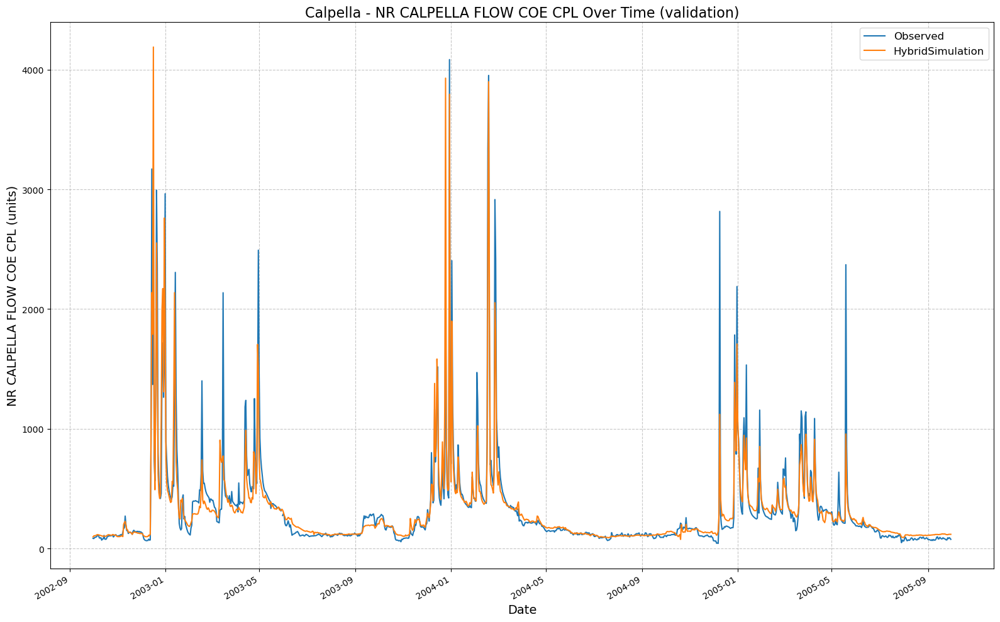

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001459/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:16:27,704: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001627/output.log initialized.
2025-02-13 00:16:27,704: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001627
2025-02-13 00:16:27,705: ### Run configurations for testing_run
2025-02-13 00:16:27,705: experiment_name: testing_run
2025-02-13 00:16:27,705: train_basin_file: calpella
2025-02-13 00:16:27,706: validation_basin_file: calpella
2025-02-13 00:16:27,706: test_basin_file: calpella
2025-02-13 00:16:27,706: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:16:27,707: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2025-02-13 00:16:27,892: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 535.12it/s]
2025-02-13 00:16:27,903: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s, Loss: 0.0000]
2025-02-13 00:16:33,927: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  1.93it/s, Loss: 0.0000]
2025-02-13 00:16:39,626: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.02it/s, Loss: 0.0000]
2025-02-13 00:16:45,066: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.04it/s, Loss: 0.0000]
2025-02-13 00:16:50,461: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.28it/s, Loss: 0.0000]
2025-02-13 00:16:55,296: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]
2025-02-13 00:17:57,709: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001627/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:17:57,710: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001627/validation/model_epoch016/validation_results.p
got predictions


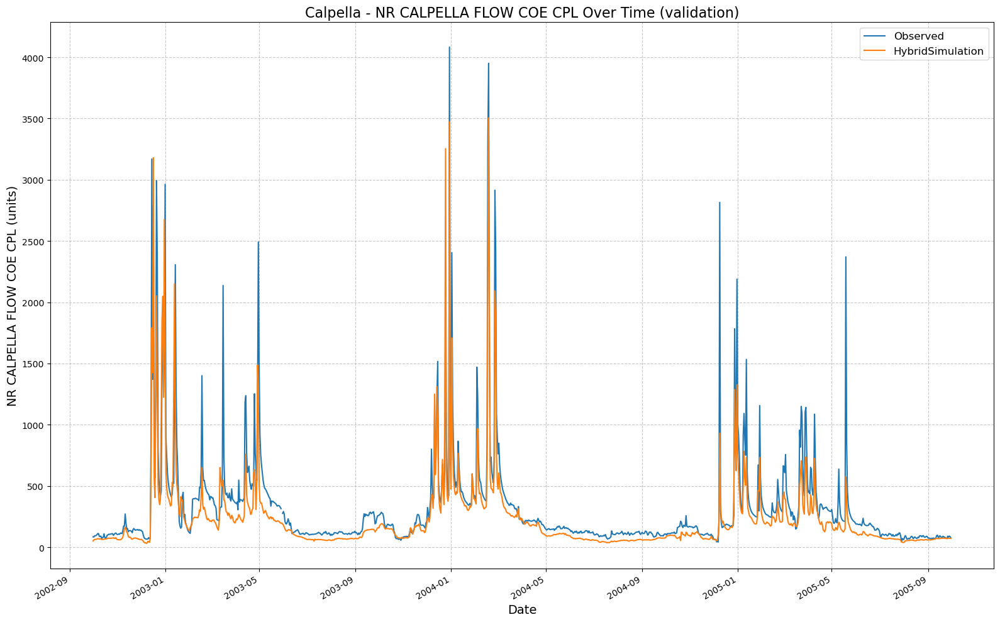

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001627/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:17:57,968: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001757/output.log initialized.
2025-02-13 00:17:57,969: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001757
2025-02-13 00:17:57,969: ### Run configurations for testing_run
2025-02-13 00:17:57,969: experiment_name: testing_run
2025-02-13 00:17:57,970: train_basin_file: calpella
2025-02-13 00:17:57,970: validation_basin_file: calpella
2025-02-13 00:17:57,970: test_basin_file: calpella
2025-02-13 00:17:57,970: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:17:57,971: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2025-02-13 00:17:58,140: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1032.06it/s]
2025-02-13 00:17:58,146: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.21it/s, Loss: 0.0000]
2025-02-13 00:18:03,266: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.18it/s, Loss: 0.0000]
2025-02-13 00:18:08,319: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  1.87it/s, Loss: 0.0000]
2025-02-13 00:18:14,193: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:06<00:00,  1.81it/s, Loss: 0.0000]
2025-02-13 00:18:20,287: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.03it/s, Loss: 0.0000]
2025-02-13 00:18:25,723: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]
2025-02-13 00:20:50,374: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001757/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:20:50,375: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001757/validation/model_epoch032/validation_results.p
got predictions


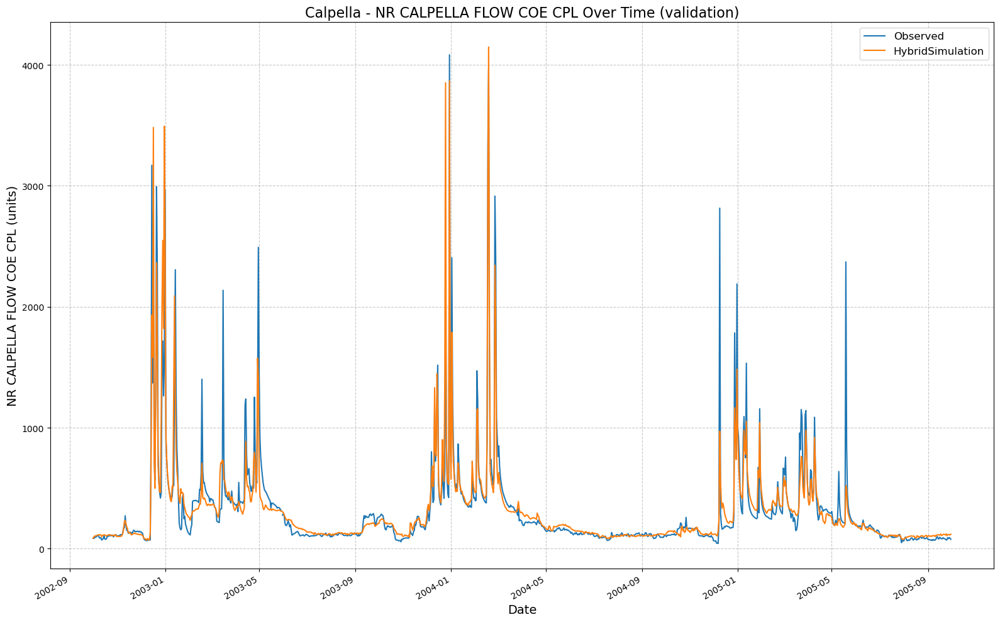

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_001757/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:20:50,618: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002050/output.log initialized.
2025-02-13 00:20:50,619: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002050
2025-02-13 00:20:50,619: ### Run configurations for testing_run
2025-02-13 00:20:50,619: experiment_name: testing_run
2025-02-13 00:20:50,620: train_basin_file: calpella
2025-02-13 00:20:50,620: validation_basin_file: calpella
2025-02-13 00:20:50,621: test_basin_file: calpella
2025-02-13 00:20:50,621: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:20:50,621: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2025-02-13 00:20:50,784: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1369.79it/s]
2025-02-13 00:20:50,790: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.16it/s, Loss: 0.0000]
2025-02-13 00:20:56,037: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-13 00:21:01,100: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.25it/s, Loss: 0.0000]
2025-02-13 00:21:05,992: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.02it/s, Loss: 0.0000]
2025-02-13 00:21:11,454: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.05it/s, Loss: 0.0000]
2025-02-13 00:21:16,819: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]
2025-02-13 00:22:20,613: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002050/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:22:20,615: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002050/validation/model_epoch016/validation_results.p
got predictions


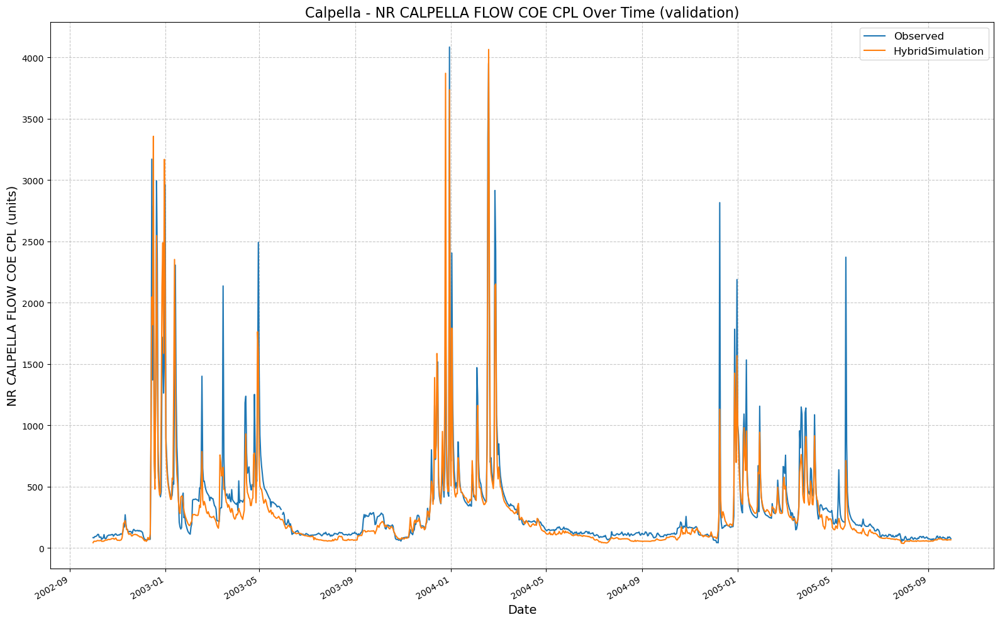

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002050/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:22:20,859: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002220/output.log initialized.
2025-02-13 00:22:20,859: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002220
2025-02-13 00:22:20,859: ### Run configurations for testing_run
2025-02-13 00:22:20,860: experiment_name: testing_run
2025-02-13 00:22:20,860: train_basin_file: calpella
2025-02-13 00:22:20,860: validation_basin_file: calpella
2025-02-13 00:22:20,861: test_basin_file: calpella
2025-02-13 00:22:20,861: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:22:20,861: train_end_date: 2002-09-30 

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2025-02-13 00:22:21,038: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 606.03it/s]
2025-02-13 00:22:21,050: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.09it/s, Loss: 0.0000]
2025-02-13 00:22:26,518: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.25it/s, Loss: 0.0000]
2025-02-13 00:22:31,410: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.12it/s, Loss: 0.0000]
2025-02-13 00:22:36,598: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.41it/s, Loss: 0.0000]
2025-02-13 00:22:41,165: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.05it/s, Loss: 0.0000]
2025-02-13 00:22:46,535: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]
2025-02-13 00:25:13,434: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002220/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:25:13,435: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002220/validation/model_epoch032/validation_results.p
got predictions


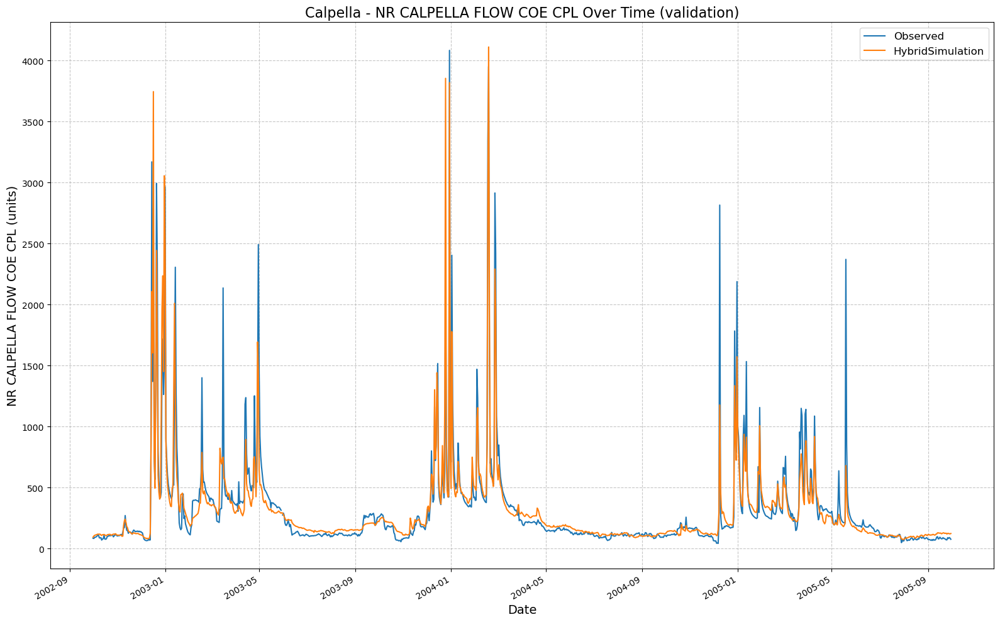

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_002220/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [13]:
for (hs, seq, nl, ep) in itertools.product(
        hyperparam_space["hidden_size"],
        hyperparam_space["seq_length"],
        hyperparam_space["num_layers"],
        hyperparam_space["epochs"]
):
    hp = {
        "hidden_size": hs,
        "seq_length": seq,
        "num_layers": nl,
        "epochs": ep,
        "output_dropout": fixed_dropout,
    }
    print(f"Physics: {hp}")
    trainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=hp,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=False,
        extend_train_period=False,
        gpu=-1
    )
    trainer.train()
    csv_path, metrics_dict = trainer.results()
    row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
    for k, v in metrics_dict.items():
        row_data[k] = v
    physics_results.append(row_data)

In [14]:
df_no_physics = pd.DataFrame(no_physics_results)
df_physics = pd.DataFrame(physics_results)
df_no_physics.sort_values(by="NSE", ascending=False, inplace=True)
df_physics.sort_values(by="NSE", ascending=False, inplace=True)
df_no_physics.reset_index(drop=True, inplace=True)
df_physics.reset_index(drop=True, inplace=True)

In [ ]:
best_no_phys = df_no_physics.iloc[0].to_dict()
best_phys = df_physics.iloc[0].to_dict()

In [15]:
df_no_physics

,hidden_size,seq_length,num_layers,epochs,output_dropout,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-KGE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,Peak-MAPE
0,256,90,1,16,0.4,0.805737,33279.265625,182.426055,0.814866,0.844984,1.010260,0.007850,0.899305,-16.788122,-2.243394,60.394389,0.4,42.170653
1,64,180,1,16,0.4,0.775624,38437.957031,196.056005,0.723187,0.744706,0.994733,-0.004030,0.893122,-25.755951,-17.490254,-2269.495766,0.4,54.959803
2,256,180,1,16,0.4,0.775103,38527.125000,196.283277,0.724399,0.754746,0.934796,-0.049886,0.892508,-23.878010,-31.470871,-35.787787,0.4,47.688513
3,256,90,1,32,0.4,0.774255,38672.449219,196.653119,0.761354,0.800872,0.935563,-0.049299,0.885336,-19.484758,-20.496009,-2258.719368,0.6,59.710803
4,128,90,2,32,0.4,0.772636,38949.742188,197.356890,0.739490,0.770957,0.947314,-0.040308,0.887621,-21.956159,-24.027584,-2267.407965,0.6,58.353300
5,128,180,2,16,0.4,0.771514,39141.933594,197.843205,0.806332,0.848914,1.002858,0.002187,0.878872,-19.342040,6.394110,-2238.499952,0.4,53.891964
6,256,180,1,32,0.4,0.767906,39760.027344,199.399166,0.741934,0.782170,0.924390,-0.057847,0.884106,-22.698049,-10.564527,-2257.727762,0.6,60.027061
7,128,180,2,32,0.4,0.765257,40213.816406,200.533829,0.774349,0.827289,0.920639,-0.060717,0.878382,-16.886617,-13.880288,-2245.431665,0.6,56.948767
8,256,90,2,32,0.4,0.764354,40368.589844,200.919362,0.727329,0.765310,0.923328,-0.058660,0.884278,-22.771291,-16.583728,-2255.805134,0.4,57.934804
9,256,180,2,16,0.4,0.763016,40597.843750,201.489066,0.656558,0.683399,0.908271,-0.070179,0.903553,-30.001926,-23.768235,56.892735,0.4,49.273291


In [16]:
df_physics

,hidden_size,seq_length,num_layers,epochs,output_dropout,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-KGE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,Peak-MAPE
0,256,90,1,32,0.4,0.845654,26441.050781,162.607044,0.865415,0.891751,0.999763,-0.000181,0.920029,-9.639125,-17.589447,43.166001,0.2,43.388357
1,64,180,1,32,0.4,0.843514,26807.726562,163.730652,0.867765,0.895703,1.001222,0.000935,0.918719,-8.401468,-12.425169,-34.285400,0.2,34.221568
2,128,180,1,16,0.4,0.840994,27239.421875,165.043697,0.845871,0.870513,1.018231,0.013948,0.918413,-11.214296,-10.478330,61.395901,0.2,39.214802
3,256,90,2,16,0.4,0.839827,27439.277344,165.648053,0.859326,0.944709,1.101683,0.077795,0.920047,-2.958121,-25.547113,66.287404,0.2,31.660511
4,128,90,1,32,0.4,0.838941,27590.990234,166.105359,0.865478,0.899405,0.968542,-0.024068,0.916411,-8.567513,-16.893961,6.604880,0.2,38.862467
5,128,180,1,32,0.4,0.837175,27893.599609,167.013771,0.872036,0.904357,0.997042,-0.002263,0.915038,-7.750712,-14.771886,40.355673,0.2,38.124833
6,64,180,2,16,0.4,0.836420,28022.958984,167.400594,0.858676,0.893331,0.962372,-0.028788,0.915276,-9.494235,-5.026780,-85.264681,0.2,39.048624
7,128,90,2,16,0.4,0.836111,28075.902344,167.558653,0.822442,0.864448,0.919811,-0.061350,0.918011,-12.563542,-0.146933,59.188769,0.2,41.747518
8,128,90,2,32,0.4,0.835352,28205.953125,167.946280,0.857159,0.886482,0.985806,-0.010860,0.914469,-10.542442,-15.651020,15.588173,0.2,41.360350
9,256,180,2,32,0.4,0.835096,28249.714844,168.076515,0.869195,0.904668,0.974677,-0.019374,0.914090,-7.696915,-15.317295,48.048074,0.2,42.179480


2025-02-13 00:51:50,911: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/output.log initialized.
2025-02-13 00:51:50,912: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150
2025-02-13 00:51:50,913: ### Run configurations for testing_run
2025-02-13 00:51:50,913: experiment_name: testing_run
2025-02-13 00:51:50,913: train_basin_file: calpella
2025-02-13 00:51:50,914: validation_basin_file: calpella
2025-02-13 00:51:50,914: test_basin_file: calpella
2025-02-13 00:51:50,914: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:51:50,915: train_end_date: 2005-09-30 00:00:00
2025-02-13 00:51:50,915: validation_start_date: 2002-10-01 00:00:00
2025-02-13 00:51:50,915: validation_end_date: 2005-09-30 00:00:00
2025-02-13 00:51:50,915: test_start_date: 2005-10-01 00:00:00
2025-02-13 00:51:50,916: test_end_date: 2009-09-29 00:00:00
2025-02-13 00:51:50,916

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]
2025-02-13 00:52:51,112: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:52:51,113: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/validation/model_epoch016/validation_results.p
2025-02-13 00:52:51,120: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/model_epoch016.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]
2025-02-13 00:52:51,851: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/test/model_epoch016/test_metrics.csv
2025-02-13 00:52:51,852: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/test/model_epoch016/test_results.p
got predictions


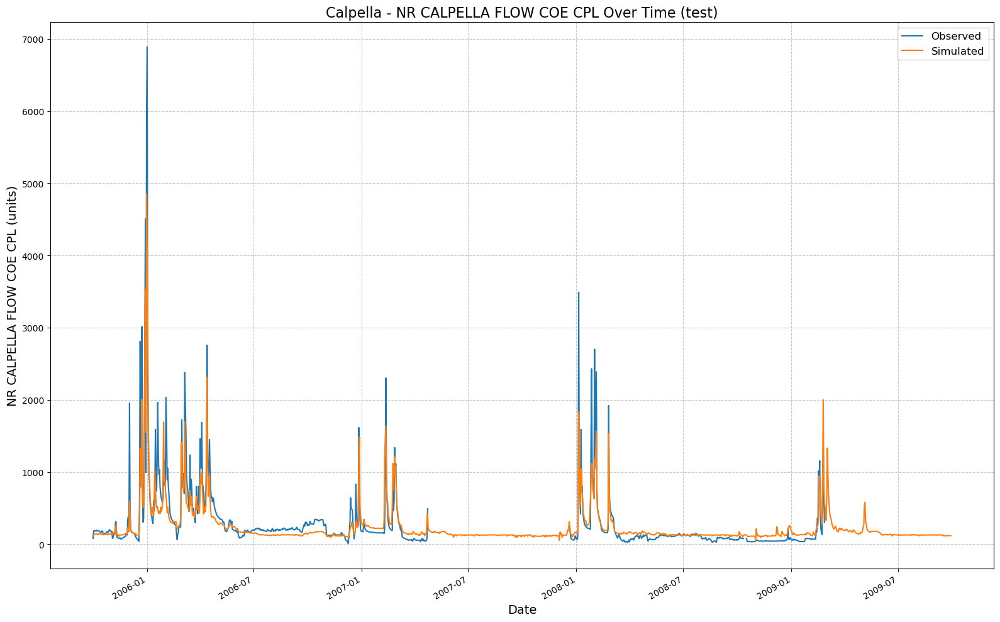

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005150/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.8008307069540024,
 'MSE': 50682.97265625,
 'RMSE': 225.12879126457815,
 'KGE': 0.7165654780170427,
 'Alpha-NSE': 0.7361662511464843,
 'Beta-KGE': 0.944222629070282,
 'Beta-NSE': -0.03275606971930775,
 'Pearson-r': 0.9127316431358071,
 'FHV': -24.901899695396423,
 'FMS': -35.91650838439794,
 'FLV': 47.29303946325483,
 'Peak-Timing': 0.5,
 'Peak-MAPE': 39.61448907852173}

In [18]:
best_no_physics_params = {
    "epochs": int(best_no_phys["epochs"]),
    "hidden_size": int(best_no_phys["hidden_size"]),
    "seq_length": int(best_no_phys["seq_length"]),
    "num_layers": int(best_no_phys["num_layers"]),
    "output_dropout": fixed_dropout,
}

lstmNoPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_no_physics_params,
    input_features=None,
    physics_informed=False,
    physics_data_file=None,
    hourly=False,
    extend_train_period=True,  
    gpu=-1
)

lstmNoPhysicsExtBest.train()
no_physics_test_csv, no_physics_test_metrics = lstmNoPhysicsExtBest.results('test')
no_physics_test_metrics

2025-02-13 00:52:52,125: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/output.log initialized.
2025-02-13 00:52:52,126: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252
2025-02-13 00:52:52,126: ### Run configurations for testing_run
2025-02-13 00:52:52,127: experiment_name: testing_run
2025-02-13 00:52:52,128: train_basin_file: calpella
2025-02-13 00:52:52,128: validation_basin_file: calpella
2025-02-13 00:52:52,129: test_basin_file: calpella
2025-02-13 00:52:52,130: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:52:52,130: train_end_date: 2005-09-30 00:00:00
2025-02-13 00:52:52,131: validation_start_date: 2002-10-01 00:00:00
2025-02-13 00:52:52,131: validation_end_date: 2005-09-30 00:00:00
2025-02-13 00:52:52,132: test_start_date: 2005-10-01 00:00:00
2025-02-13 00:52:52,132: test_end_date: 2009-09-29 00:00:00
2025-02-13 00:52:52,133

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]
2025-02-13 00:54:53,534: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:54:53,536: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/validation/model_epoch032/validation_results.p
2025-02-13 00:54:53,547: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/model_epoch032.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimen

# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]
2025-02-13 00:54:54,384: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/test/model_epoch032/test_metrics.csv
2025-02-13 00:54:54,386: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/test/model_epoch032/test_results.p
got predictions


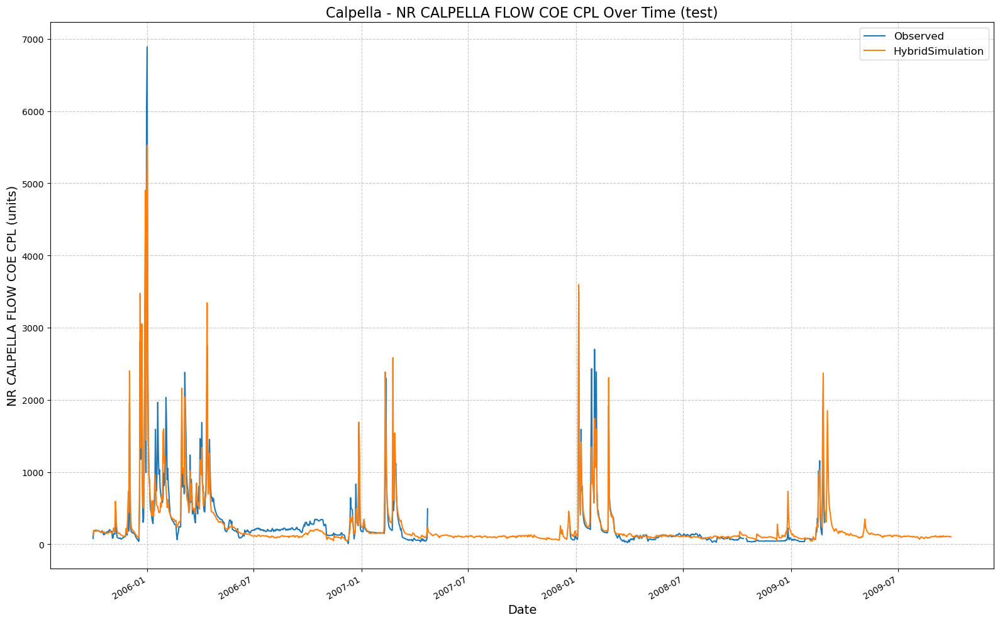

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/runs/testing_run_1302_005252/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/calpella_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.8596593737602234,
 'MSE': 35712.734375,
 'RMSE': 188.9781320020917,
 'KGE': 0.9087646915063821,
 'Alpha-NSE': 0.9448224769649005,
 'Beta-KGE': 1.0005296468734741,
 'Beta-NSE': 0.00031101248569031007,
 'Pearson-r': 0.9273429842215762,
 'FHV': -1.0372302494943142,
 'FMS': -12.214793046240743,
 'FLV': 53.33962255675656,
 'Peak-Timing': 0.0,
 'Peak-MAPE': 27.09656715393066}

In [19]:
best_physics_params = {
    "epochs": int(best_phys["epochs"]),
    "hidden_size": int(best_phys["hidden_size"]),
    "seq_length": int(best_phys["seq_length"]),
    "num_layers": int(best_phys["num_layers"]),
    "output_dropout": fixed_dropout,
}

lstmPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_physics_params,
    input_features=features_with_physics,
    physics_informed=True,
    physics_data_file=path_to_physics_data,
    hourly=False,
    extend_train_period=True,
    gpu=-1
)

lstmPhysicsExtBest.train()
physics_test_csv, physics_test_metrics = lstmPhysicsExtBest.results('test')
physics_test_metrics

In [ ]:
fancyCombinedPlot(lstm_results=no_physics_test_csv, lstmPhysics_results= physics_test_csv, HMS_results=path_to_physics_data, title='Calpella Basin Daily Model Comparison', fName = "calpella_daily_metrics.csv")